**SegResNet, SCAFFOLD**

**Imports & Drive Mount**

In [55]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [56]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [57]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [58]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [ ]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/SegResNet/Federated_SegResNet3D_checkpoints"
log_dir = "D:/F25-156/SegResNet/Federated_SegResNet3D_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/SegResNet/Federated_SegResNet3D_logs"

Checkpoints will be saved to: D:/F25-156/ResNet/Federated_SegResNet3D_checkpoints
TensorBoard logs will be saved to: D:/F25-156/ResNet/Federated_SegResNet3D_logs
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 17604), started 1:16:44 ago. (Use '!kill 17604' to kill it.)

In [60]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [61]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [62]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [63]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


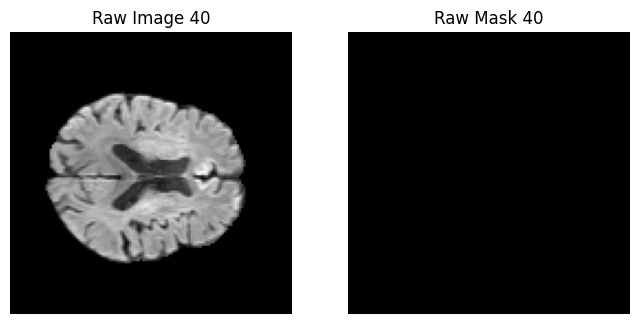

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


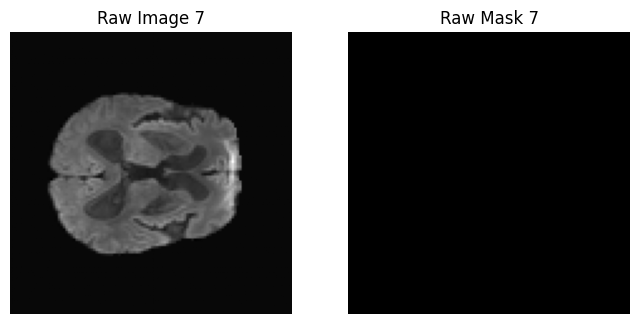

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


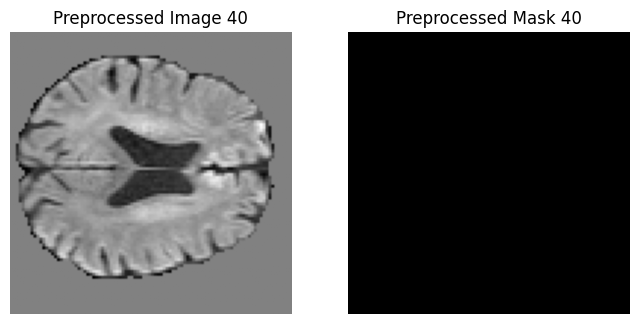

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


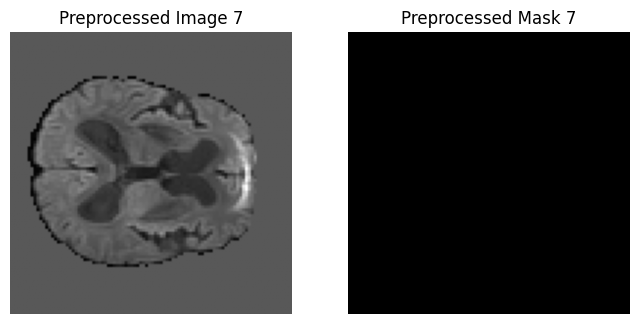

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


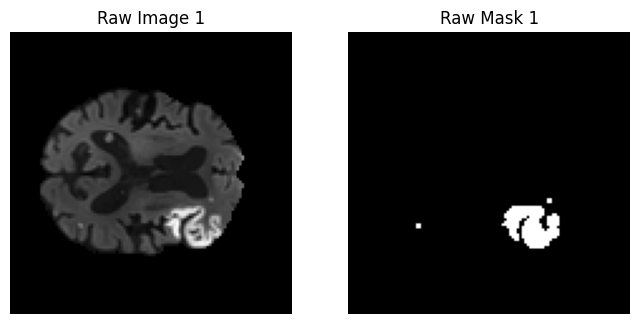

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


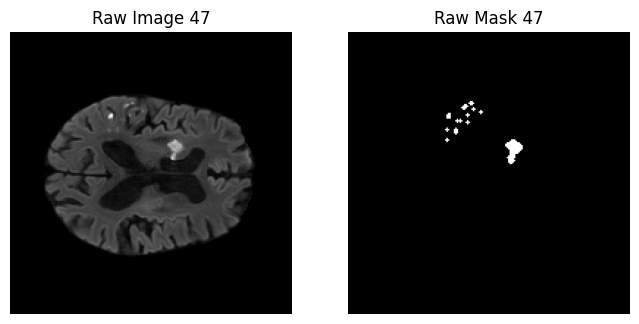

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


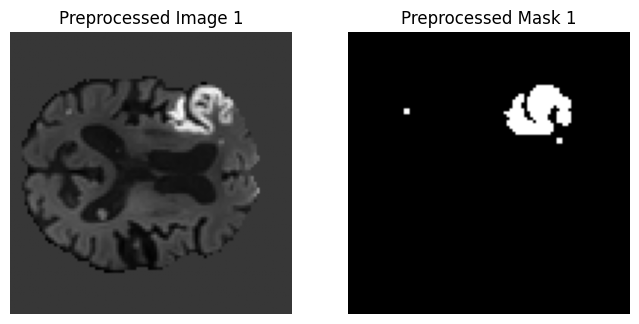

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


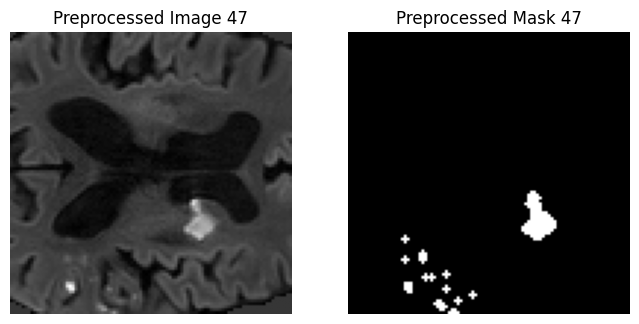

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


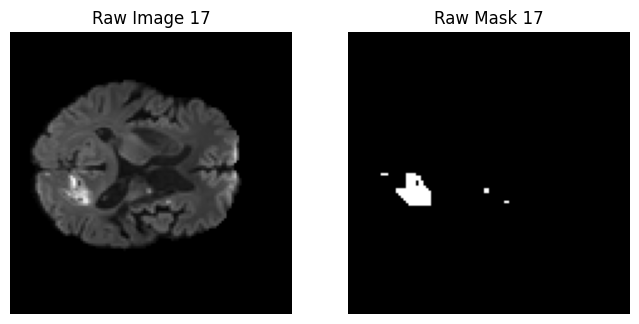

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


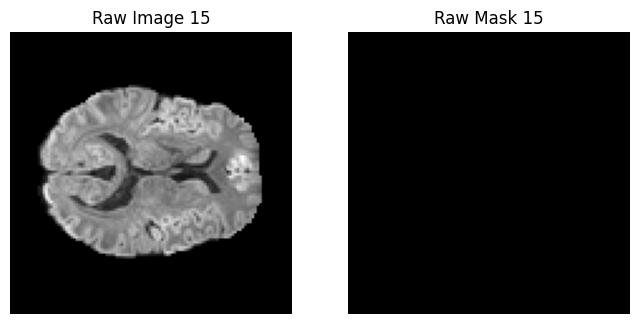

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


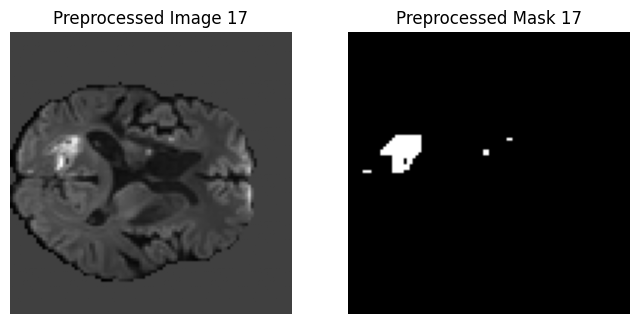

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


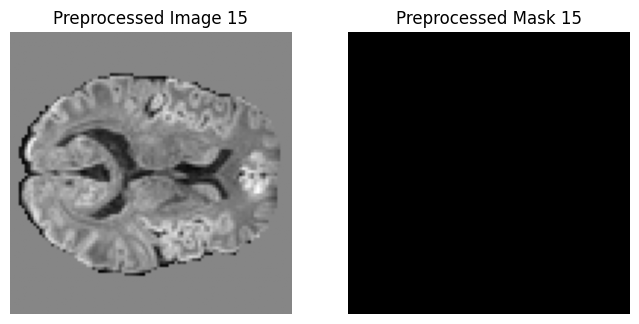

Client 2 samples: 50


In [64]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [65]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


ResNet

In [66]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [67]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


In [68]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    ).to(device)
    print(model)
    return model

**Client Class**

In [ ]:

class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.SGD(self.model.parameters(), lr=1e-2, momentum=0) #SCAFFOLD uses SGD instead of Adam
        
        # --- SCAFFOLD CHANGE START ---
        # client control variate c_i
        self.c_i = {name: torch.zeros_like(param).to(device) 
                    for name, param in self.model.named_parameters()}
        # --- SCAFFOLD CHANGE END ---

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)
        
    # --- SCAFFOLD CHANGE START ---
    # server also sends control variate c
    def set_server_control(self, c):
        self.c = {k: v.clone().to(self.device) for k, v in c.items()}
    # --- SCAFFOLD CHANGE END ---


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0
        
        # --- SCAFFOLD CHANGE START ---
        # store initial parameters to compute update later
        global_params = {name: param.clone().detach()
                         for name, param in self.model.named_parameters()}
        # count local steps
        local_steps = 0
        # --- SCAFFOLD CHANGE END ---

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                loss.backward()
                
                # --- SCAFFOLD CHANGE START ---
                # modify gradients using control variates
                for name, param in self.model.named_parameters():
                    if param.grad is not None:
                        param.grad -= self.c_i[name]
                        param.grad += self.c[name]
                # --- SCAFFOLD CHANGE END ---
                
                self.optimizer.step()
                local_steps += 1

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)
        
        # --- SCAFFOLD CHANGE START ---
        # update client control variate
        new_c_i = {}
        delta_c_i = {}

        lr = self.optimizer.param_groups[0]["lr"] 
        for name, param in self.model.named_parameters():
            # diff = (initial_params - final_params)
            diff = global_params[name] - param.detach()
            
            # K is local_steps (total batches processed)
            # new_c_i_plus = c_i - c + (diff / (K * lr))
            new_c_i_plus = self.c_i[name] - self.c[name] + (diff / (local_steps * lr))

            delta_c_i[name] = new_c_i_plus - self.c_i[name]
            new_c_i[name] = new_c_i_plus

        # update client control
        self.c_i = new_c_i
        print("mean |c_i|:", torch.mean(
            torch.stack([v.abs().mean() for v in self.c_i.values()])
        ))
        print("max |c_i|:", max(v.abs().max().item() for v in self.c_i.values()))
        # --- SCAFFOLD CHANGE END ---

        # Return last epoch metrics 
        return avg_loss, mean_dice, mean_iou, mean_hd95, delta_c_i

**Server Class**

In [ ]:
class Server:
    def __init__(self, val_loader, device, server_lr=1):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader
        self.server_lr=server_lr #ng
        
        # --- SCAFFOLD CHANGE START ---
        # server control variate
        self.c = {name: torch.zeros_like(param).to(device)
            for name, param in self.global_model.named_parameters()}
        # --- SCAFFOLD CHANGE END ---

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    
    def aggregate(self, client_params_list, delta_c_list):

        global_params = self.global_model.state_dict()
        new_params = {}
        
        # find delta (new clients - old global)
        for key in global_params.keys():

            # if not a learnable parameter (not a float tensor), skip it
            if not torch.is_floating_point(global_params[key]):
                new_params[key] = global_params[key]
                continue

            delta = torch.zeros_like(global_params[key])

            for client in client_params_list:
                delta += client[key].to(self.device) - global_params[key]

            delta /= len(client_params_list)  # |S|

            new_params[key] = global_params[key] + self.server_lr * delta

        self.global_model.load_state_dict(new_params)

        # ---- Control variate update ----
        for name in self.c.keys():

            update = torch.zeros_like(self.c[name])

            for delta_c in delta_c_list:
                update += delta_c[name].to(self.device)

            update /= num_clients   # 1/N

            self.c[name] += update

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)
            
            # --- SCAFFOLD CHANGE START ---
            # send server control variate to clients
            client.set_server_control(self.c)
            # --- SCAFFOLD CHANGE END ---

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [71]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

**Federated Training loop**

In [72]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []
    delta_c_list = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95, delta_c_i = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())
        delta_c_list.append(delta_c_i)

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params, delta_c_list)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8781 | Dice: 0.0290 | IoU: 0.0147 | HD95: 52.9624


Client 0 | Epoch 2/20 | Loss: 0.8166 | Dice: 0.1319 | IoU: 0.0706 | HD95: 37.5537


Client 0 | Epoch 3/20 | Loss: 0.7845 | Dice: 0.1668 | IoU: 0.0910 | HD95: 35.0457


Client 0 | Epoch 4/20 | Loss: 0.7623 | Dice: 0.1830 | IoU: 0.1007 | HD95: 34.7604


Client 0 | Epoch 5/20 | Loss: 0.7450 | Dice: 0.1850 | IoU: 0.1019 | HD95: 34.4685


Client 0 | Epoch 6/20 | Loss: 0.7328 | Dice: 0.1919 | IoU: 0.1061 | HD95: 34.3351


Client 0 | Epoch 7/20 | Loss: 0.7209 | Dice: 0.1956 | IoU: 0.1084 | HD95: 34.8232


Client 0 | Epoch 8/20 | Loss: 0.7106 | Dice: 0.2015 | IoU: 0.1121 | HD95: 34.4359


Client 0 | Epoch 9/20 | Loss: 0.7029 | Dice: 0.1983 | IoU: 0.1101 | HD95: 34.6257


Client 0 | Epoch 10/20 | Loss: 0.6923 | Dice: 0.2173 | IoU: 0.1219 | HD95: 34.6156


Client 0 | Epoch 11/20 | Loss: 0.6832 | Dice: 0.2113 | IoU: 0.1181 | HD95: 34.8278


Client 0 | Epoch 12/20 | Loss: 0.6747 | Dice: 0.2238 | IoU: 0.1260 | HD95: 34.5432


Client 0 | Epoch 13/20 | Loss: 0.6659 | Dice: 0.2180 | IoU: 0.1223 | HD95: 34.9461


Client 0 | Epoch 14/20 | Loss: 0.6558 | Dice: 0.2331 | IoU: 0.1319 | HD95: 34.6798


Client 0 | Epoch 15/20 | Loss: 0.6425 | Dice: 0.2792 | IoU: 0.1623 | HD95: 35.1207


Client 0 | Epoch 16/20 | Loss: 0.6376 | Dice: 0.2379 | IoU: 0.1350 | HD95: 34.7712


Client 0 | Epoch 17/20 | Loss: 0.6233 | Dice: 0.2739 | IoU: 0.1586 | HD95: 34.9841


Client 0 | Epoch 18/20 | Loss: 0.6140 | Dice: 0.2641 | IoU: 0.1521 | HD95: 34.4559


Client 0 | Epoch 19/20 | Loss: 0.5963 | Dice: 0.3073 | IoU: 0.1816 | HD95: 34.5847


Clients Training:  33%|███▎      | 1/3 [02:49<05:38, 169.05s/it]

Client 0 | Epoch 20/20 | Loss: 0.5759 | Dice: 0.3297 | IoU: 0.1974 | HD95: 33.9197
mean |c_i|: tensor(0.0011, device='cuda:0')
max |c_i|: 0.060616087168455124
Client 0 | Loss=0.6958 | Dice=0.3297 | IoU=0.1974 | HD95=33.9197


Client 1 | Epoch 1/20 | Loss: 0.8775 | Dice: 0.0240 | IoU: 0.0122 | HD95: 49.4734


Client 1 | Epoch 2/20 | Loss: 0.8169 | Dice: 0.1156 | IoU: 0.0614 | HD95: 34.8509


Client 1 | Epoch 3/20 | Loss: 0.7851 | Dice: 0.1688 | IoU: 0.0922 | HD95: 33.5632


Client 1 | Epoch 4/20 | Loss: 0.7627 | Dice: 0.1880 | IoU: 0.1038 | HD95: 33.6835


Client 1 | Epoch 5/20 | Loss: 0.7461 | Dice: 0.2043 | IoU: 0.1138 | HD95: 32.9954


Client 1 | Epoch 6/20 | Loss: 0.7330 | Dice: 0.2160 | IoU: 0.1211 | HD95: 32.7041


Client 1 | Epoch 7/20 | Loss: 0.7213 | Dice: 0.2129 | IoU: 0.1191 | HD95: 33.2391


Client 1 | Epoch 8/20 | Loss: 0.7113 | Dice: 0.2090 | IoU: 0.1167 | HD95: 32.9770


Client 1 | Epoch 9/20 | Loss: 0.7019 | Dice: 0.2176 | IoU: 0.1221 | HD95: 33.1761


Client 1 | Epoch 10/20 | Loss: 0.6922 | Dice: 0.2276 | IoU: 0.1284 | HD95: 32.7300


Client 1 | Epoch 11/20 | Loss: 0.6839 | Dice: 0.2276 | IoU: 0.1284 | HD95: 32.9746


Client 1 | Epoch 12/20 | Loss: 0.6748 | Dice: 0.2308 | IoU: 0.1305 | HD95: 33.0928


Client 1 | Epoch 13/20 | Loss: 0.6651 | Dice: 0.2438 | IoU: 0.1388 | HD95: 33.1340


Client 1 | Epoch 14/20 | Loss: 0.6544 | Dice: 0.2468 | IoU: 0.1408 | HD95: 33.1602


Client 1 | Epoch 15/20 | Loss: 0.6392 | Dice: 0.2962 | IoU: 0.1739 | HD95: 32.4697


Client 1 | Epoch 16/20 | Loss: 0.6296 | Dice: 0.2693 | IoU: 0.1556 | HD95: 32.4779


Client 1 | Epoch 17/20 | Loss: 0.6139 | Dice: 0.3106 | IoU: 0.1839 | HD95: 32.9030


Client 1 | Epoch 18/20 | Loss: 0.5937 | Dice: 0.3186 | IoU: 0.1895 | HD95: 31.9954


Client 1 | Epoch 19/20 | Loss: 0.5764 | Dice: 0.3455 | IoU: 0.2088 | HD95: 31.9562


Clients Training:  67%|██████▋   | 2/3 [05:47<02:54, 174.71s/it]

Client 1 | Epoch 20/20 | Loss: 0.5574 | Dice: 0.3530 | IoU: 0.2143 | HD95: 31.6428
mean |c_i|: tensor(0.0011, device='cuda:0')
max |c_i|: 0.0626428946852684
Client 1 | Loss=0.6918 | Dice=0.3530 | IoU=0.2143 | HD95=31.6428


Client 2 | Epoch 1/20 | Loss: 0.8777 | Dice: 0.0390 | IoU: 0.0199 | HD95: 50.2276


Client 2 | Epoch 2/20 | Loss: 0.8146 | Dice: 0.1548 | IoU: 0.0839 | HD95: 37.3269


Client 2 | Epoch 3/20 | Loss: 0.7808 | Dice: 0.2043 | IoU: 0.1137 | HD95: 36.2860


Client 2 | Epoch 4/20 | Loss: 0.7573 | Dice: 0.2444 | IoU: 0.1392 | HD95: 35.9762


Client 2 | Epoch 5/20 | Loss: 0.7396 | Dice: 0.2452 | IoU: 0.1398 | HD95: 35.7979


Client 2 | Epoch 6/20 | Loss: 0.7244 | Dice: 0.2607 | IoU: 0.1499 | HD95: 35.6024


Client 2 | Epoch 7/20 | Loss: 0.7110 | Dice: 0.2681 | IoU: 0.1548 | HD95: 35.4135


Client 2 | Epoch 8/20 | Loss: 0.6987 | Dice: 0.2852 | IoU: 0.1663 | HD95: 35.3158


Client 2 | Epoch 9/20 | Loss: 0.6869 | Dice: 0.2846 | IoU: 0.1659 | HD95: 34.9520


Client 2 | Epoch 10/20 | Loss: 0.6754 | Dice: 0.2861 | IoU: 0.1669 | HD95: 35.7864


Client 2 | Epoch 11/20 | Loss: 0.6623 | Dice: 0.3019 | IoU: 0.1778 | HD95: 35.3021


Client 2 | Epoch 12/20 | Loss: 0.6489 | Dice: 0.3091 | IoU: 0.1828 | HD95: 34.6830


Client 2 | Epoch 13/20 | Loss: 0.6336 | Dice: 0.3215 | IoU: 0.1916 | HD95: 34.7352


Client 2 | Epoch 14/20 | Loss: 0.6186 | Dice: 0.3416 | IoU: 0.2060 | HD95: 34.3547


Client 2 | Epoch 15/20 | Loss: 0.5982 | Dice: 0.3372 | IoU: 0.2028 | HD95: 33.2809


Client 2 | Epoch 16/20 | Loss: 0.5745 | Dice: 0.3653 | IoU: 0.2234 | HD95: 33.1723


Client 2 | Epoch 17/20 | Loss: 0.5465 | Dice: 0.3923 | IoU: 0.2441 | HD95: 33.3311


Client 2 | Epoch 18/20 | Loss: 0.5164 | Dice: 0.4331 | IoU: 0.2764 | HD95: 32.0210


Client 2 | Epoch 19/20 | Loss: 0.5079 | Dice: 0.3966 | IoU: 0.2473 | HD95: 33.0813


Client 2 Epochs: 100%|██████████| 20/20 [02:54<00:00,  8.73s/it]

Client 2 | Epoch 20/20 | Loss: 0.4835 | Dice: 0.4206 | IoU: 0.2663 | HD95: 31.4295
mean |c_i|: tensor(0.0013, device='cuda:0')
max |c_i|: 0.0707349106669426


Client 2 | Loss=0.6628 | Dice=0.4206 | IoU=0.2663 | HD95=31.4295
Best global model updated with Dice=0.3124
Global | Val Loss=0.5739 | Dice=0.3124 | IoU=0.1851 | HD95=36.0222
Checkpoint saved for round 1 at D:/F25-156/ResNet/Federated_SegResNet3D_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5490 | Dice: 0.3406 | IoU: 0.2053 | HD95: 31.3949


Client 0 | Epoch 2/20 | Loss: 0.5581 | Dice: 0.3010 | IoU: 0.1772 | HD95: 32.6144


Client 0 | Epoch 3/20 | Loss: 0.5163 | Dice: 0.3726 | IoU: 0.2289 | HD95: 31.8064


Client 0 | Epoch 4/20 | Loss: 0.5022 | Dice: 0.3905 | IoU: 0.2426 | HD95: 30.1723


Client 0 | Epoch 5/20 | Loss: 0.5126 | Dice: 0.3438 | IoU: 0.2076 | HD95: 30.9869


Client 0 | Epoch 6/20 | Loss: 0.4826 | Dice: 0.3842 | IoU: 0.2378 | HD95: 29.7226


Client 0 | Epoch 7/20 | Loss: 0.4866 | Dice: 0.3779 | IoU: 0.2330 | HD95: 29.4245


Client 0 | Epoch 8/20 | Loss: 0.4483 | Dice: 0.4248 | IoU: 0.2697 | HD95: 27.2825


Client 0 | Epoch 9/20 | Loss: 0.4433 | Dice: 0.4292 | IoU: 0.2733 | HD95: 26.0491


Client 0 | Epoch 10/20 | Loss: 0.4098 | Dice: 0.4815 | IoU: 0.3171 | HD95: 26.9552


Client 0 | Epoch 11/20 | Loss: 0.4720 | Dice: 0.3799 | IoU: 0.2345 | HD95: 25.1789


Client 0 | Epoch 12/20 | Loss: 0.4245 | Dice: 0.4481 | IoU: 0.2887 | HD95: 22.3021


Client 0 | Epoch 13/20 | Loss: 0.4161 | Dice: 0.4612 | IoU: 0.2997 | HD95: 24.3874


Client 0 | Epoch 14/20 | Loss: 0.4290 | Dice: 0.4421 | IoU: 0.2838 | HD95: 24.8058


Client 0 | Epoch 15/20 | Loss: 0.4064 | Dice: 0.4621 | IoU: 0.3005 | HD95: 22.1070


Client 0 | Epoch 16/20 | Loss: 0.3438 | Dice: 0.5636 | IoU: 0.3924 | HD95: 18.6216


Client 0 | Epoch 17/20 | Loss: 0.3675 | Dice: 0.5218 | IoU: 0.3530 | HD95: 19.8290


Client 0 | Epoch 18/20 | Loss: 0.3263 | Dice: 0.5841 | IoU: 0.4126 | HD95: 15.5921


Client 0 | Epoch 19/20 | Loss: 0.3451 | Dice: 0.5568 | IoU: 0.3858 | HD95: 17.1494


Clients Training:  33%|███▎      | 1/3 [02:41<05:23, 161.90s/it]

Client 0 | Epoch 20/20 | Loss: 0.3141 | Dice: 0.5956 | IoU: 0.4240 | HD95: 17.8681
mean |c_i|: tensor(0.0006, device='cuda:0')
max |c_i|: 0.03462463989853859
Client 0 | Loss=0.4377 | Dice=0.5956 | IoU=0.4240 | HD95=17.8681


Client 1 | Epoch 1/20 | Loss: 0.5353 | Dice: 0.3632 | IoU: 0.2219 | HD95: 31.1034


Client 1 | Epoch 2/20 | Loss: 0.5269 | Dice: 0.3443 | IoU: 0.2079 | HD95: 29.6269


Client 1 | Epoch 3/20 | Loss: 0.5044 | Dice: 0.3849 | IoU: 0.2383 | HD95: 30.2758


Client 1 | Epoch 4/20 | Loss: 0.4877 | Dice: 0.3871 | IoU: 0.2400 | HD95: 29.5424


Client 1 | Epoch 5/20 | Loss: 0.4761 | Dice: 0.4033 | IoU: 0.2526 | HD95: 29.9682


Client 1 | Epoch 6/20 | Loss: 0.4453 | Dice: 0.4484 | IoU: 0.2890 | HD95: 25.2451


Client 1 | Epoch 7/20 | Loss: 0.4219 | Dice: 0.4730 | IoU: 0.3098 | HD95: 23.4574


Client 1 | Epoch 8/20 | Loss: 0.4228 | Dice: 0.4605 | IoU: 0.2991 | HD95: 21.6868


Client 1 | Epoch 9/20 | Loss: 0.4206 | Dice: 0.4544 | IoU: 0.2940 | HD95: 24.5118


Client 1 | Epoch 10/20 | Loss: 0.4113 | Dice: 0.4611 | IoU: 0.2996 | HD95: 20.8854


Client 1 | Epoch 11/20 | Loss: 0.4101 | Dice: 0.4565 | IoU: 0.2958 | HD95: 21.0159


Client 1 | Epoch 12/20 | Loss: 0.3872 | Dice: 0.4866 | IoU: 0.3216 | HD95: 20.9214


Client 1 | Epoch 13/20 | Loss: 0.3620 | Dice: 0.5213 | IoU: 0.3526 | HD95: 20.8156


Client 1 | Epoch 14/20 | Loss: 0.3835 | Dice: 0.4977 | IoU: 0.3313 | HD95: 16.8241


Client 1 | Epoch 15/20 | Loss: 0.3520 | Dice: 0.5371 | IoU: 0.3672 | HD95: 17.5180


Client 1 | Epoch 16/20 | Loss: 0.3190 | Dice: 0.5824 | IoU: 0.4108 | HD95: 14.6267


Client 1 | Epoch 17/20 | Loss: 0.3303 | Dice: 0.5582 | IoU: 0.3871 | HD95: 16.7088


Client 1 | Epoch 18/20 | Loss: 0.3393 | Dice: 0.5482 | IoU: 0.3776 | HD95: 13.6710


Client 1 | Epoch 19/20 | Loss: 0.2818 | Dice: 0.6372 | IoU: 0.4676 | HD95: 12.5456


Clients Training:  67%|██████▋   | 2/3 [05:24<02:42, 162.10s/it]

Client 1 | Epoch 20/20 | Loss: 0.3347 | Dice: 0.5516 | IoU: 0.3808 | HD95: 18.2834
mean |c_i|: tensor(0.0007, device='cuda:0')
max |c_i|: 0.03712711110711098
Client 1 | Loss=0.4076 | Dice=0.5516 | IoU=0.3808 | HD95=18.2834


Client 2 | Epoch 1/20 | Loss: 0.5035 | Dice: 0.4020 | IoU: 0.2516 | HD95: 32.0745


Client 2 | Epoch 2/20 | Loss: 0.4776 | Dice: 0.4255 | IoU: 0.2703 | HD95: 31.8728


Client 2 | Epoch 3/20 | Loss: 0.4640 | Dice: 0.4328 | IoU: 0.2762 | HD95: 29.8351


Client 2 | Epoch 4/20 | Loss: 0.4476 | Dice: 0.4499 | IoU: 0.2902 | HD95: 30.6310


Client 2 | Epoch 5/20 | Loss: 0.4386 | Dice: 0.4476 | IoU: 0.2884 | HD95: 30.3324


Client 2 | Epoch 6/20 | Loss: 0.4170 | Dice: 0.4726 | IoU: 0.3094 | HD95: 26.7870


Client 2 | Epoch 7/20 | Loss: 0.4021 | Dice: 0.4962 | IoU: 0.3299 | HD95: 28.6235


Client 2 | Epoch 8/20 | Loss: 0.4052 | Dice: 0.4743 | IoU: 0.3108 | HD95: 28.2249


Client 2 | Epoch 9/20 | Loss: 0.4077 | Dice: 0.4690 | IoU: 0.3063 | HD95: 25.9743


Client 2 | Epoch 10/20 | Loss: 0.3973 | Dice: 0.4731 | IoU: 0.3098 | HD95: 25.9573


Client 2 | Epoch 11/20 | Loss: 0.3753 | Dice: 0.5146 | IoU: 0.3464 | HD95: 23.3702


Client 2 | Epoch 12/20 | Loss: 0.3737 | Dice: 0.5111 | IoU: 0.3433 | HD95: 21.0389


Client 2 | Epoch 13/20 | Loss: 0.3584 | Dice: 0.5322 | IoU: 0.3626 | HD95: 23.6501


Client 2 | Epoch 14/20 | Loss: 0.3550 | Dice: 0.5332 | IoU: 0.3635 | HD95: 19.5437


Client 2 | Epoch 15/20 | Loss: 0.3444 | Dice: 0.5452 | IoU: 0.3748 | HD95: 20.1862


Client 2 | Epoch 16/20 | Loss: 0.3318 | Dice: 0.5665 | IoU: 0.3952 | HD95: 18.6051


Client 2 | Epoch 17/20 | Loss: 0.3289 | Dice: 0.5670 | IoU: 0.3956 | HD95: 18.0694


Client 2 | Epoch 18/20 | Loss: 0.3413 | Dice: 0.5452 | IoU: 0.3748 | HD95: 18.4514


Client 2 | Epoch 19/20 | Loss: 0.3026 | Dice: 0.6099 | IoU: 0.4388 | HD95: 17.0150


Client 2 Epochs: 100%|██████████| 20/20 [02:42<00:00,  8.13s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.3048 | Dice: 0.5995 | IoU: 0.4281 | HD95: 17.0731
mean |c_i|: tensor(0.0007, device='cuda:0')
max |c_i|: 0.03768807277083397
Client 2 | Loss=0.3888 | Dice=0.5995 | IoU=0.4281 | HD95=17.0731


Best global model updated with Dice=0.5990
Global | Val Loss=0.3091 | Dice=0.5990 | IoU=0.4276 | HD95=18.7661
Checkpoint saved for round 2 at D:/F25-156/ResNet/Federated_SegResNet3D_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3412 | Dice: 0.5553 | IoU: 0.3844 | HD95: 19.4351


Client 0 | Epoch 2/20 | Loss: 0.3332 | Dice: 0.5679 | IoU: 0.3965 | HD95: 20.2514


Client 0 | Epoch 3/20 | Loss: 0.3072 | Dice: 0.6126 | IoU: 0.4416 | HD95: 14.3897


Client 0 | Epoch 4/20 | Loss: 0.3271 | Dice: 0.5755 | IoU: 0.4040 | HD95: 14.7428


Client 0 | Epoch 5/20 | Loss: 0.3720 | Dice: 0.5067 | IoU: 0.3393 | HD95: 18.8948


Client 0 | Epoch 6/20 | Loss: 0.3916 | Dice: 0.4741 | IoU: 0.3107 | HD95: 22.2066


Client 0 | Epoch 7/20 | Loss: 0.3447 | Dice: 0.5410 | IoU: 0.3708 | HD95: 18.1233


Client 0 | Epoch 8/20 | Loss: 0.2806 | Dice: 0.6357 | IoU: 0.4659 | HD95: 11.8266


Client 0 | Epoch 9/20 | Loss: 0.2864 | Dice: 0.6294 | IoU: 0.4592 | HD95: 14.4521


Client 0 | Epoch 10/20 | Loss: 0.2731 | Dice: 0.6485 | IoU: 0.4799 | HD95: 12.9942


Client 0 | Epoch 11/20 | Loss: 0.2633 | Dice: 0.6610 | IoU: 0.4937 | HD95: 9.9333


Client 0 | Epoch 12/20 | Loss: 0.2683 | Dice: 0.6554 | IoU: 0.4875 | HD95: 10.2023


Client 0 | Epoch 13/20 | Loss: 0.2569 | Dice: 0.6711 | IoU: 0.5050 | HD95: 11.7274


Client 0 | Epoch 14/20 | Loss: 0.2552 | Dice: 0.6691 | IoU: 0.5028 | HD95: 11.1314


Client 0 | Epoch 15/20 | Loss: 0.2667 | Dice: 0.6525 | IoU: 0.4843 | HD95: 12.4447


Client 0 | Epoch 16/20 | Loss: 0.2151 | Dice: 0.7286 | IoU: 0.5730 | HD95: 7.9406


Client 0 | Epoch 17/20 | Loss: 0.2146 | Dice: 0.7262 | IoU: 0.5701 | HD95: 8.3991


Client 0 | Epoch 18/20 | Loss: 0.2284 | Dice: 0.7081 | IoU: 0.5482 | HD95: 10.6014


Client 0 | Epoch 19/20 | Loss: 0.2697 | Dice: 0.6523 | IoU: 0.4840 | HD95: 11.9413


Clients Training:  33%|███▎      | 1/3 [02:36<05:12, 156.17s/it]

Client 0 | Epoch 20/20 | Loss: 0.2902 | Dice: 0.6225 | IoU: 0.4519 | HD95: 12.6197
mean |c_i|: tensor(0.0003, device='cuda:0')
max |c_i|: 0.013501218520104885
Client 0 | Loss=0.2893 | Dice=0.6225 | IoU=0.4519 | HD95=12.6197


Client 1 | Epoch 1/20 | Loss: 0.3560 | Dice: 0.5160 | IoU: 0.3477 | HD95: 19.4365


Client 1 | Epoch 2/20 | Loss: 0.3273 | Dice: 0.5598 | IoU: 0.3887 | HD95: 17.1952


Client 1 | Epoch 3/20 | Loss: 0.3361 | Dice: 0.5438 | IoU: 0.3734 | HD95: 17.5478


Client 1 | Epoch 4/20 | Loss: 0.3268 | Dice: 0.5617 | IoU: 0.3905 | HD95: 16.9167


Client 1 | Epoch 5/20 | Loss: 0.3215 | Dice: 0.5676 | IoU: 0.3963 | HD95: 15.2446


Client 1 | Epoch 6/20 | Loss: 0.3256 | Dice: 0.5593 | IoU: 0.3882 | HD95: 16.2117


Client 1 | Epoch 7/20 | Loss: 0.2859 | Dice: 0.6179 | IoU: 0.4471 | HD95: 15.0921


Client 1 | Epoch 8/20 | Loss: 0.2772 | Dice: 0.6308 | IoU: 0.4607 | HD95: 12.5316


Client 1 | Epoch 9/20 | Loss: 0.2784 | Dice: 0.6289 | IoU: 0.4587 | HD95: 13.7434


Client 1 | Epoch 10/20 | Loss: 0.3032 | Dice: 0.5944 | IoU: 0.4229 | HD95: 16.4107


Client 1 | Epoch 11/20 | Loss: 0.2597 | Dice: 0.6487 | IoU: 0.4800 | HD95: 12.4195


Client 1 | Epoch 12/20 | Loss: 0.2523 | Dice: 0.6658 | IoU: 0.4990 | HD95: 11.6517


Client 1 | Epoch 13/20 | Loss: 0.2743 | Dice: 0.6441 | IoU: 0.4751 | HD95: 13.2102


Client 1 | Epoch 14/20 | Loss: 0.2635 | Dice: 0.6432 | IoU: 0.4741 | HD95: 12.3995


Client 1 | Epoch 15/20 | Loss: 0.2476 | Dice: 0.6705 | IoU: 0.5044 | HD95: 11.6518


Client 1 | Epoch 16/20 | Loss: 0.2496 | Dice: 0.6683 | IoU: 0.5018 | HD95: 13.2073


Client 1 | Epoch 17/20 | Loss: 0.2079 | Dice: 0.7301 | IoU: 0.5749 | HD95: 9.1695


Client 1 | Epoch 18/20 | Loss: 0.2281 | Dice: 0.7008 | IoU: 0.5394 | HD95: 10.7848


Client 1 | Epoch 19/20 | Loss: 0.2199 | Dice: 0.7101 | IoU: 0.5505 | HD95: 8.8376


Clients Training:  67%|██████▋   | 2/3 [05:14<02:37, 157.47s/it]

Client 1 | Epoch 20/20 | Loss: 0.2383 | Dice: 0.6846 | IoU: 0.5205 | HD95: 10.6253
mean |c_i|: tensor(0.0003, device='cuda:0')
max |c_i|: 0.014442835003137589
Client 1 | Loss=0.2790 | Dice=0.6846 | IoU=0.5205 | HD95=10.6253


Client 2 | Epoch 1/20 | Loss: 0.3312 | Dice: 0.5495 | IoU: 0.3788 | HD95: 17.9336


Client 2 | Epoch 2/20 | Loss: 0.2950 | Dice: 0.6127 | IoU: 0.4417 | HD95: 16.4704


Client 2 | Epoch 3/20 | Loss: 0.3225 | Dice: 0.5614 | IoU: 0.3902 | HD95: 16.8401


Client 2 | Epoch 4/20 | Loss: 0.3506 | Dice: 0.5200 | IoU: 0.3513 | HD95: 16.8472


Client 2 | Epoch 5/20 | Loss: 0.2895 | Dice: 0.6127 | IoU: 0.4417 | HD95: 17.5626


Client 2 | Epoch 6/20 | Loss: 0.3130 | Dice: 0.5794 | IoU: 0.4079 | HD95: 17.9184


Client 2 | Epoch 7/20 | Loss: 0.2953 | Dice: 0.6128 | IoU: 0.4417 | HD95: 15.6882


Client 2 | Epoch 8/20 | Loss: 0.3357 | Dice: 0.5493 | IoU: 0.3786 | HD95: 16.2674


Client 2 | Epoch 9/20 | Loss: 0.2660 | Dice: 0.6492 | IoU: 0.4806 | HD95: 13.8791


Client 2 | Epoch 10/20 | Loss: 0.2755 | Dice: 0.6337 | IoU: 0.4638 | HD95: 15.3591


Client 2 | Epoch 11/20 | Loss: 0.2461 | Dice: 0.6772 | IoU: 0.5120 | HD95: 10.9479


Client 2 | Epoch 12/20 | Loss: 0.2413 | Dice: 0.6780 | IoU: 0.5128 | HD95: 11.0327


Client 2 | Epoch 13/20 | Loss: 0.2288 | Dice: 0.7017 | IoU: 0.5404 | HD95: 12.0385


Client 2 | Epoch 14/20 | Loss: 0.2381 | Dice: 0.6849 | IoU: 0.5208 | HD95: 8.9546


Client 2 | Epoch 15/20 | Loss: 0.2553 | Dice: 0.6634 | IoU: 0.4963 | HD95: 14.0576


Client 2 | Epoch 16/20 | Loss: 0.2448 | Dice: 0.6716 | IoU: 0.5056 | HD95: 13.7906


Client 2 | Epoch 17/20 | Loss: 0.2208 | Dice: 0.7102 | IoU: 0.5506 | HD95: 10.6197


Client 2 | Epoch 18/20 | Loss: 0.2522 | Dice: 0.6580 | IoU: 0.4903 | HD95: 12.9488


Client 2 | Epoch 19/20 | Loss: 0.2197 | Dice: 0.7082 | IoU: 0.5482 | HD95: 9.6967


Client 2 Epochs: 100%|██████████| 20/20 [02:37<00:00,  7.86s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.2039 | Dice: 0.7331 | IoU: 0.5786 | HD95: 9.5766
mean |c_i|: tensor(0.0003, device='cuda:0')
max |c_i|: 0.014590080827474594
Client 2 | Loss=0.2713 | Dice=0.7331 | IoU=0.5786 | HD95=9.5766


Best global model updated with Dice=0.6586
Global | Val Loss=0.2584 | Dice=0.6586 | IoU=0.4909 | HD95=12.7492
Checkpoint saved for round 3 at D:/F25-156/ResNet/Federated_SegResNet3D_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2296 | Dice: 0.7062 | IoU: 0.5458 | HD95: 9.4368


Client 0 | Epoch 2/20 | Loss: 0.2424 | Dice: 0.6859 | IoU: 0.5219 | HD95: 11.1420


Client 0 | Epoch 3/20 | Loss: 0.2101 | Dice: 0.7318 | IoU: 0.5770 | HD95: 9.2999


Client 0 | Epoch 4/20 | Loss: 0.2528 | Dice: 0.6700 | IoU: 0.5038 | HD95: 12.0725


Client 0 | Epoch 5/20 | Loss: 0.2800 | Dice: 0.6316 | IoU: 0.4616 | HD95: 14.3019


Client 0 | Epoch 6/20 | Loss: 0.2657 | Dice: 0.6527 | IoU: 0.4845 | HD95: 13.4553


Client 0 | Epoch 7/20 | Loss: 0.2350 | Dice: 0.6969 | IoU: 0.5348 | HD95: 11.2659


Client 0 | Epoch 8/20 | Loss: 0.2717 | Dice: 0.6451 | IoU: 0.4761 | HD95: 12.1693


Client 0 | Epoch 9/20 | Loss: 0.2326 | Dice: 0.7010 | IoU: 0.5396 | HD95: 10.7791


Client 0 | Epoch 10/20 | Loss: 0.2217 | Dice: 0.7121 | IoU: 0.5529 | HD95: 7.7778


Client 0 | Epoch 11/20 | Loss: 0.2250 | Dice: 0.7108 | IoU: 0.5514 | HD95: 9.5480


Client 0 | Epoch 12/20 | Loss: 0.1906 | Dice: 0.7594 | IoU: 0.6121 | HD95: 6.3544


Client 0 | Epoch 13/20 | Loss: 0.1829 | Dice: 0.7684 | IoU: 0.6239 | HD95: 5.3691


Client 0 | Epoch 14/20 | Loss: 0.1812 | Dice: 0.7719 | IoU: 0.6286 | HD95: 7.8326


Client 0 | Epoch 15/20 | Loss: 0.1805 | Dice: 0.7713 | IoU: 0.6278 | HD95: 7.4889


Client 0 | Epoch 16/20 | Loss: 0.1848 | Dice: 0.7650 | IoU: 0.6194 | HD95: 6.9260


Client 0 | Epoch 17/20 | Loss: 0.1755 | Dice: 0.7787 | IoU: 0.6376 | HD95: 5.7293


Client 0 | Epoch 18/20 | Loss: 0.1894 | Dice: 0.7570 | IoU: 0.6090 | HD95: 8.1702


Client 0 | Epoch 19/20 | Loss: 0.2427 | Dice: 0.6849 | IoU: 0.5208 | HD95: 10.7655


Clients Training:  33%|███▎      | 1/3 [02:34<05:09, 154.77s/it]

Client 0 | Epoch 20/20 | Loss: 0.2452 | Dice: 0.6862 | IoU: 0.5223 | HD95: 9.8948
mean |c_i|: tensor(0.0002, device='cuda:0')
max |c_i|: 0.006734431255608797
Client 0 | Loss=0.2220 | Dice=0.6862 | IoU=0.5223 | HD95=9.8948


Client 1 | Epoch 1/20 | Loss: 0.2428 | Dice: 0.6717 | IoU: 0.5057 | HD95: 12.8128


Client 1 | Epoch 2/20 | Loss: 0.2309 | Dice: 0.6916 | IoU: 0.5285 | HD95: 10.8446


Client 1 | Epoch 3/20 | Loss: 0.2586 | Dice: 0.6462 | IoU: 0.4773 | HD95: 15.0763


Client 1 | Epoch 4/20 | Loss: 0.2165 | Dice: 0.7100 | IoU: 0.5504 | HD95: 9.9673


Client 1 | Epoch 5/20 | Loss: 0.2159 | Dice: 0.7119 | IoU: 0.5527 | HD95: 11.0094


Client 1 | Epoch 6/20 | Loss: 0.2129 | Dice: 0.7123 | IoU: 0.5532 | HD95: 10.7477


Client 1 | Epoch 7/20 | Loss: 0.2524 | Dice: 0.6613 | IoU: 0.4940 | HD95: 11.2582


Client 1 | Epoch 8/20 | Loss: 0.2307 | Dice: 0.6855 | IoU: 0.5215 | HD95: 9.5215


Client 1 | Epoch 9/20 | Loss: 0.1974 | Dice: 0.7387 | IoU: 0.5857 | HD95: 9.6854


Client 1 | Epoch 10/20 | Loss: 0.1969 | Dice: 0.7355 | IoU: 0.5817 | HD95: 7.8693


Client 1 | Epoch 11/20 | Loss: 0.1810 | Dice: 0.7616 | IoU: 0.6150 | HD95: 8.2693


Client 1 | Epoch 12/20 | Loss: 0.2001 | Dice: 0.7322 | IoU: 0.5776 | HD95: 9.2942


Client 1 | Epoch 13/20 | Loss: 0.1963 | Dice: 0.7352 | IoU: 0.5812 | HD95: 9.0148


Client 1 | Epoch 14/20 | Loss: 0.2075 | Dice: 0.7197 | IoU: 0.5621 | HD95: 10.2396


Client 1 | Epoch 15/20 | Loss: 0.1959 | Dice: 0.7325 | IoU: 0.5779 | HD95: 8.0116


Client 1 | Epoch 16/20 | Loss: 0.2943 | Dice: 0.5952 | IoU: 0.4237 | HD95: 14.3540


Client 1 | Epoch 17/20 | Loss: 0.2446 | Dice: 0.6695 | IoU: 0.5031 | HD95: 11.1477


Client 1 | Epoch 18/20 | Loss: 0.2004 | Dice: 0.7287 | IoU: 0.5732 | HD95: 9.5236


Client 1 | Epoch 19/20 | Loss: 0.1879 | Dice: 0.7442 | IoU: 0.5926 | HD95: 9.1622


Clients Training:  67%|██████▋   | 2/3 [05:05<02:32, 152.21s/it]

Client 1 | Epoch 20/20 | Loss: 0.1766 | Dice: 0.7642 | IoU: 0.6184 | HD95: 8.1807
mean |c_i|: tensor(0.0002, device='cuda:0')
max |c_i|: 0.007551748305559158
Client 1 | Loss=0.2170 | Dice=0.7642 | IoU=0.6184 | HD95=8.1807


Client 2 | Epoch 1/20 | Loss: 0.2297 | Dice: 0.6891 | IoU: 0.5257 | HD95: 11.8525


Client 2 | Epoch 2/20 | Loss: 0.2398 | Dice: 0.6763 | IoU: 0.5110 | HD95: 12.3591


Client 2 | Epoch 3/20 | Loss: 0.2228 | Dice: 0.7011 | IoU: 0.5398 | HD95: 10.6931


Client 2 | Epoch 4/20 | Loss: 0.2282 | Dice: 0.6898 | IoU: 0.5264 | HD95: 11.3568


Client 2 | Epoch 5/20 | Loss: 0.2277 | Dice: 0.6946 | IoU: 0.5321 | HD95: 9.4897


Client 2 | Epoch 6/20 | Loss: 0.2156 | Dice: 0.7082 | IoU: 0.5482 | HD95: 11.4511


Client 2 | Epoch 7/20 | Loss: 0.2448 | Dice: 0.6665 | IoU: 0.4998 | HD95: 11.3038


Client 2 | Epoch 8/20 | Loss: 0.2116 | Dice: 0.7185 | IoU: 0.5607 | HD95: 8.9684


Client 2 | Epoch 9/20 | Loss: 0.1910 | Dice: 0.7439 | IoU: 0.5923 | HD95: 8.7346


Client 2 | Epoch 10/20 | Loss: 0.1750 | Dice: 0.7655 | IoU: 0.6200 | HD95: 6.9396


Client 2 | Epoch 11/20 | Loss: 0.1609 | Dice: 0.7864 | IoU: 0.6480 | HD95: 7.1879


Client 2 | Epoch 12/20 | Loss: 0.1746 | Dice: 0.7668 | IoU: 0.6218 | HD95: 8.4629


Client 2 | Epoch 13/20 | Loss: 0.2135 | Dice: 0.7095 | IoU: 0.5498 | HD95: 11.9597


Client 2 | Epoch 14/20 | Loss: 0.1951 | Dice: 0.7367 | IoU: 0.5832 | HD95: 8.5764


Client 2 | Epoch 15/20 | Loss: 0.1933 | Dice: 0.7388 | IoU: 0.5858 | HD95: 7.3458


Client 2 | Epoch 16/20 | Loss: 0.1650 | Dice: 0.7789 | IoU: 0.6379 | HD95: 7.4584


Client 2 | Epoch 17/20 | Loss: 0.1627 | Dice: 0.7823 | IoU: 0.6425 | HD95: 8.0717


Client 2 | Epoch 18/20 | Loss: 0.1544 | Dice: 0.7943 | IoU: 0.6587 | HD95: 6.4014


Client 2 | Epoch 19/20 | Loss: 0.1526 | Dice: 0.7957 | IoU: 0.6608 | HD95: 6.2942


Client 2 Epochs: 100%|██████████| 20/20 [02:27<00:00,  7.40s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1622 | Dice: 0.7824 | IoU: 0.6426 | HD95: 6.4985
mean |c_i|: tensor(0.0002, device='cuda:0')
max |c_i|: 0.008068984374403954
Client 2 | Loss=0.1960 | Dice=0.7824 | IoU=0.6426 | HD95=6.4985


Best global model updated with Dice=0.7183
Global | Val Loss=0.2157 | Dice=0.7183 | IoU=0.5605 | HD95=10.1534
Checkpoint saved for round 4 at D:/F25-156/ResNet/Federated_SegResNet3D_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1993 | Dice: 0.7449 | IoU: 0.5935 | HD95: 7.3372


Client 0 | Epoch 2/20 | Loss: 0.2530 | Dice: 0.6661 | IoU: 0.4993 | HD95: 11.8291


Client 0 | Epoch 3/20 | Loss: 0.2090 | Dice: 0.7336 | IoU: 0.5793 | HD95: 6.8751


Client 0 | Epoch 4/20 | Loss: 0.1876 | Dice: 0.7625 | IoU: 0.6161 | HD95: 6.8646


Client 0 | Epoch 5/20 | Loss: 0.1899 | Dice: 0.7590 | IoU: 0.6116 | HD95: 8.1279


Client 0 | Epoch 6/20 | Loss: 0.1713 | Dice: 0.7861 | IoU: 0.6476 | HD95: 5.4912


Client 0 | Epoch 7/20 | Loss: 0.1640 | Dice: 0.7970 | IoU: 0.6625 | HD95: 5.1974


Client 0 | Epoch 8/20 | Loss: 0.1630 | Dice: 0.7939 | IoU: 0.6582 | HD95: 5.1606


Client 0 | Epoch 9/20 | Loss: 0.1605 | Dice: 0.7998 | IoU: 0.6664 | HD95: 5.0035


Client 0 | Epoch 10/20 | Loss: 0.1761 | Dice: 0.7762 | IoU: 0.6343 | HD95: 6.9365


Client 0 | Epoch 11/20 | Loss: 0.2460 | Dice: 0.6808 | IoU: 0.5161 | HD95: 12.6615


Client 0 | Epoch 12/20 | Loss: 0.1634 | Dice: 0.7966 | IoU: 0.6620 | HD95: 5.3624


Client 0 | Epoch 13/20 | Loss: 0.1753 | Dice: 0.7810 | IoU: 0.6407 | HD95: 7.2368


Client 0 | Epoch 14/20 | Loss: 0.1588 | Dice: 0.8015 | IoU: 0.6687 | HD95: 5.0660


Client 0 | Epoch 15/20 | Loss: 0.1607 | Dice: 0.7999 | IoU: 0.6665 | HD95: 5.5105


Client 0 | Epoch 16/20 | Loss: 0.1845 | Dice: 0.7652 | IoU: 0.6198 | HD95: 7.7525


Client 0 | Epoch 17/20 | Loss: 0.1587 | Dice: 0.8028 | IoU: 0.6706 | HD95: 6.0433


Client 0 | Epoch 18/20 | Loss: 0.1564 | Dice: 0.8046 | IoU: 0.6731 | HD95: 5.0625


Client 0 | Epoch 19/20 | Loss: 0.1502 | Dice: 0.8145 | IoU: 0.6870 | HD95: 4.5953


Clients Training:  33%|███▎      | 1/3 [02:27<04:54, 147.32s/it]

Client 0 | Epoch 20/20 | Loss: 0.1921 | Dice: 0.7555 | IoU: 0.6070 | HD95: 7.1237
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.004465600475668907
Client 0 | Loss=0.1810 | Dice=0.7555 | IoU=0.6070 | HD95=7.1237


Client 1 | Epoch 1/20 | Loss: 0.1764 | Dice: 0.7656 | IoU: 0.6202 | HD95: 8.4215


Client 1 | Epoch 2/20 | Loss: 0.1758 | Dice: 0.7635 | IoU: 0.6174 | HD95: 9.3817


Client 1 | Epoch 3/20 | Loss: 0.2074 | Dice: 0.7176 | IoU: 0.5595 | HD95: 10.1185


Client 1 | Epoch 4/20 | Loss: 0.1838 | Dice: 0.7527 | IoU: 0.6034 | HD95: 9.2578


Client 1 | Epoch 5/20 | Loss: 0.1902 | Dice: 0.7452 | IoU: 0.5939 | HD95: 9.2711


Client 1 | Epoch 6/20 | Loss: 0.1688 | Dice: 0.7736 | IoU: 0.6307 | HD95: 7.0215


Client 1 | Epoch 7/20 | Loss: 0.1611 | Dice: 0.7841 | IoU: 0.6449 | HD95: 7.9588


Client 1 | Epoch 8/20 | Loss: 0.1761 | Dice: 0.7651 | IoU: 0.6196 | HD95: 8.2727


Client 1 | Epoch 9/20 | Loss: 0.1619 | Dice: 0.7854 | IoU: 0.6467 | HD95: 6.6939


Client 1 | Epoch 10/20 | Loss: 0.1990 | Dice: 0.7335 | IoU: 0.5792 | HD95: 10.7079


Client 1 | Epoch 11/20 | Loss: 0.2235 | Dice: 0.6960 | IoU: 0.5337 | HD95: 9.5251


Client 1 | Epoch 12/20 | Loss: 0.1767 | Dice: 0.7624 | IoU: 0.6160 | HD95: 8.2142


Client 1 | Epoch 13/20 | Loss: 0.1530 | Dice: 0.7950 | IoU: 0.6597 | HD95: 5.1819


Client 1 | Epoch 14/20 | Loss: 0.1818 | Dice: 0.7549 | IoU: 0.6062 | HD95: 7.7509


Client 1 | Epoch 15/20 | Loss: 0.1789 | Dice: 0.7597 | IoU: 0.6125 | HD95: 6.9129


Client 1 | Epoch 16/20 | Loss: 0.1467 | Dice: 0.8022 | IoU: 0.6697 | HD95: 5.9310


Client 1 | Epoch 17/20 | Loss: 0.1809 | Dice: 0.7551 | IoU: 0.6066 | HD95: 7.6016


Client 1 | Epoch 18/20 | Loss: 0.2548 | Dice: 0.6557 | IoU: 0.4877 | HD95: 12.3519


Client 1 | Epoch 19/20 | Loss: 0.1670 | Dice: 0.7770 | IoU: 0.6354 | HD95: 7.1592


Clients Training:  67%|██████▋   | 2/3 [04:56<02:28, 148.21s/it]

Client 1 | Epoch 20/20 | Loss: 0.1658 | Dice: 0.7763 | IoU: 0.6344 | HD95: 7.8219
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.005754461977630854
Client 1 | Loss=0.1815 | Dice=0.7763 | IoU=0.6344 | HD95=7.8219


Client 2 | Epoch 1/20 | Loss: 0.1622 | Dice: 0.7824 | IoU: 0.6426 | HD95: 8.1956


Client 2 | Epoch 2/20 | Loss: 0.1703 | Dice: 0.7724 | IoU: 0.6292 | HD95: 6.8525


Client 2 | Epoch 3/20 | Loss: 0.1964 | Dice: 0.7310 | IoU: 0.5760 | HD95: 8.4837


Client 2 | Epoch 4/20 | Loss: 0.1766 | Dice: 0.7599 | IoU: 0.6127 | HD95: 9.6856


Client 2 | Epoch 5/20 | Loss: 0.1848 | Dice: 0.7515 | IoU: 0.6019 | HD95: 9.2977


Client 2 | Epoch 6/20 | Loss: 0.1820 | Dice: 0.7513 | IoU: 0.6017 | HD95: 8.6314


Client 2 | Epoch 7/20 | Loss: 0.1754 | Dice: 0.7604 | IoU: 0.6134 | HD95: 6.9632


Client 2 | Epoch 8/20 | Loss: 0.2061 | Dice: 0.7170 | IoU: 0.5588 | HD95: 10.8657


Client 2 | Epoch 9/20 | Loss: 0.1737 | Dice: 0.7628 | IoU: 0.6165 | HD95: 7.2864


Client 2 | Epoch 10/20 | Loss: 0.1918 | Dice: 0.7435 | IoU: 0.5918 | HD95: 10.7984


Client 2 | Epoch 11/20 | Loss: 0.1700 | Dice: 0.7704 | IoU: 0.6265 | HD95: 8.4667


Client 2 | Epoch 12/20 | Loss: 0.1765 | Dice: 0.7598 | IoU: 0.6126 | HD95: 7.4906


Client 2 | Epoch 13/20 | Loss: 0.1631 | Dice: 0.7766 | IoU: 0.6347 | HD95: 6.4880


Client 2 | Epoch 14/20 | Loss: 0.1666 | Dice: 0.7755 | IoU: 0.6333 | HD95: 8.7082


Client 2 | Epoch 15/20 | Loss: 0.1522 | Dice: 0.7929 | IoU: 0.6568 | HD95: 7.1408


Client 2 | Epoch 16/20 | Loss: 0.1522 | Dice: 0.7955 | IoU: 0.6604 | HD95: 6.6081


Client 2 | Epoch 17/20 | Loss: 0.1536 | Dice: 0.7896 | IoU: 0.6523 | HD95: 8.4386


Client 2 | Epoch 18/20 | Loss: 0.1570 | Dice: 0.7900 | IoU: 0.6528 | HD95: 7.1160


Client 2 | Epoch 19/20 | Loss: 0.1370 | Dice: 0.8149 | IoU: 0.6876 | HD95: 5.5903


Client 2 Epochs: 100%|██████████| 20/20 [02:27<00:00,  7.37s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1421 | Dice: 0.8058 | IoU: 0.6747 | HD95: 6.0696
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.005267907865345478
Client 2 | Loss=0.1695 | Dice=0.8058 | IoU=0.6747 | HD95=6.0696


Global | Val Loss=0.2209 | Dice=0.7045 | IoU=0.5438 | HD95=9.4152
Checkpoint saved for round 5 at D:/F25-156/ResNet/Federated_SegResNet3D_checkpoints\federated_round5.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1617 | Dice: 0.7966 | IoU: 0.6619 | HD95: 4.6933


Client 0 | Epoch 2/20 | Loss: 0.1640 | Dice: 0.7929 | IoU: 0.6569 | HD95: 4.9091


Client 0 | Epoch 3/20 | Loss: 0.1612 | Dice: 0.7958 | IoU: 0.6608 | HD95: 4.8711


Client 0 | Epoch 4/20 | Loss: 0.1596 | Dice: 0.7989 | IoU: 0.6651 | HD95: 4.3120


Client 0 | Epoch 5/20 | Loss: 0.1715 | Dice: 0.7827 | IoU: 0.6429 | HD95: 5.9732


Client 0 | Epoch 6/20 | Loss: 0.1746 | Dice: 0.7774 | IoU: 0.6358 | HD95: 4.9490


Client 0 | Epoch 7/20 | Loss: 0.1650 | Dice: 0.7907 | IoU: 0.6538 | HD95: 5.1488


Client 0 | Epoch 8/20 | Loss: 0.1528 | Dice: 0.8069 | IoU: 0.6763 | HD95: 4.1892


Client 0 | Epoch 9/20 | Loss: 0.1472 | Dice: 0.8157 | IoU: 0.6888 | HD95: 4.5337


Client 0 | Epoch 10/20 | Loss: 0.1879 | Dice: 0.7601 | IoU: 0.6130 | HD95: 7.9292


Client 0 | Epoch 11/20 | Loss: 0.1530 | Dice: 0.8094 | IoU: 0.6798 | HD95: 4.5054


Client 0 | Epoch 12/20 | Loss: 0.1457 | Dice: 0.8184 | IoU: 0.6926 | HD95: 5.1103


Client 0 | Epoch 13/20 | Loss: 0.2905 | Dice: 0.6173 | IoU: 0.4464 | HD95: 14.3573


Client 0 | Epoch 14/20 | Loss: 0.2876 | Dice: 0.6182 | IoU: 0.4474 | HD95: 16.5573


Client 0 | Epoch 15/20 | Loss: 0.3074 | Dice: 0.5942 | IoU: 0.4227 | HD95: 15.2569


Client 0 | Epoch 16/20 | Loss: 0.2286 | Dice: 0.7034 | IoU: 0.5425 | HD95: 9.5126


Client 0 | Epoch 17/20 | Loss: 0.2066 | Dice: 0.7347 | IoU: 0.5807 | HD95: 6.7690


Client 0 | Epoch 18/20 | Loss: 0.1941 | Dice: 0.7518 | IoU: 0.6023 | HD95: 5.2409


Client 0 | Epoch 19/20 | Loss: 0.1847 | Dice: 0.7656 | IoU: 0.6202 | HD95: 7.5136


Clients Training:  33%|███▎      | 1/3 [02:26<04:53, 146.75s/it]

Client 0 | Epoch 20/20 | Loss: 0.1705 | Dice: 0.7847 | IoU: 0.6457 | HD95: 5.1770
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.003092041239142418
Client 0 | Loss=0.1907 | Dice=0.7847 | IoU=0.6457 | HD95=5.1770


Client 1 | Epoch 1/20 | Loss: 0.1639 | Dice: 0.7795 | IoU: 0.6387 | HD95: 6.0824


Client 1 | Epoch 2/20 | Loss: 0.1512 | Dice: 0.7976 | IoU: 0.6634 | HD95: 6.5011


Client 1 | Epoch 3/20 | Loss: 0.1486 | Dice: 0.8003 | IoU: 0.6670 | HD95: 6.2707


Client 1 | Epoch 4/20 | Loss: 0.1731 | Dice: 0.7681 | IoU: 0.6235 | HD95: 7.2232


Client 1 | Epoch 5/20 | Loss: 0.1905 | Dice: 0.7399 | IoU: 0.5872 | HD95: 8.7200


Client 1 | Epoch 6/20 | Loss: 0.1814 | Dice: 0.7548 | IoU: 0.6062 | HD95: 6.2059


Client 1 | Epoch 7/20 | Loss: 0.1589 | Dice: 0.7824 | IoU: 0.6425 | HD95: 6.6092


Client 1 | Epoch 8/20 | Loss: 0.1589 | Dice: 0.7850 | IoU: 0.6461 | HD95: 6.9381


Client 1 | Epoch 9/20 | Loss: 0.1496 | Dice: 0.7984 | IoU: 0.6644 | HD95: 6.8444


Client 1 | Epoch 10/20 | Loss: 0.1503 | Dice: 0.7983 | IoU: 0.6643 | HD95: 6.2641


Client 1 | Epoch 11/20 | Loss: 0.1587 | Dice: 0.7863 | IoU: 0.6479 | HD95: 6.9824


Client 1 | Epoch 12/20 | Loss: 0.1582 | Dice: 0.7850 | IoU: 0.6461 | HD95: 6.1537


Client 1 | Epoch 13/20 | Loss: 0.1392 | Dice: 0.8107 | IoU: 0.6817 | HD95: 5.3268


Client 1 | Epoch 14/20 | Loss: 0.1295 | Dice: 0.8263 | IoU: 0.7040 | HD95: 4.4327


Client 1 | Epoch 15/20 | Loss: 0.1312 | Dice: 0.8231 | IoU: 0.6993 | HD95: 4.5662


Client 1 | Epoch 16/20 | Loss: 0.1559 | Dice: 0.7869 | IoU: 0.6487 | HD95: 5.9730


Client 1 | Epoch 17/20 | Loss: 0.1730 | Dice: 0.7646 | IoU: 0.6189 | HD95: 6.6593


Client 1 | Epoch 18/20 | Loss: 0.1408 | Dice: 0.8079 | IoU: 0.6778 | HD95: 5.4145


Client 1 | Epoch 19/20 | Loss: 0.1379 | Dice: 0.8147 | IoU: 0.6873 | HD95: 6.2393


Clients Training:  67%|██████▋   | 2/3 [04:55<02:28, 148.15s/it]

Client 1 | Epoch 20/20 | Loss: 0.1306 | Dice: 0.8234 | IoU: 0.6998 | HD95: 5.2757
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.003920693416148424
Client 1 | Loss=0.1541 | Dice=0.8234 | IoU=0.6998 | HD95=5.2757


Client 2 | Epoch 1/20 | Loss: 0.1336 | Dice: 0.8195 | IoU: 0.6942 | HD95: 5.5745


Client 2 | Epoch 2/20 | Loss: 0.1481 | Dice: 0.7999 | IoU: 0.6665 | HD95: 7.2157


Client 2 | Epoch 3/20 | Loss: 0.1368 | Dice: 0.8162 | IoU: 0.6895 | HD95: 7.3019


Client 2 | Epoch 4/20 | Loss: 0.1423 | Dice: 0.8066 | IoU: 0.6759 | HD95: 5.8251


Client 2 | Epoch 5/20 | Loss: 0.2352 | Dice: 0.6793 | IoU: 0.5144 | HD95: 10.8296


Client 2 | Epoch 6/20 | Loss: 0.2342 | Dice: 0.6823 | IoU: 0.5178 | HD95: 12.3628


Client 2 | Epoch 7/20 | Loss: 0.1776 | Dice: 0.7607 | IoU: 0.6138 | HD95: 10.6012


Client 2 | Epoch 8/20 | Loss: 0.1677 | Dice: 0.7693 | IoU: 0.6251 | HD95: 6.7788


Client 2 | Epoch 9/20 | Loss: 0.1673 | Dice: 0.7715 | IoU: 0.6281 | HD95: 7.5620


Client 2 | Epoch 10/20 | Loss: 0.1478 | Dice: 0.8016 | IoU: 0.6689 | HD95: 8.0888


Client 2 | Epoch 11/20 | Loss: 0.1984 | Dice: 0.7293 | IoU: 0.5740 | HD95: 9.6555


Client 2 | Epoch 12/20 | Loss: 0.1630 | Dice: 0.7810 | IoU: 0.6407 | HD95: 7.4796


Client 2 | Epoch 13/20 | Loss: 0.1805 | Dice: 0.7590 | IoU: 0.6117 | HD95: 9.5661


Client 2 | Epoch 14/20 | Loss: 0.1826 | Dice: 0.7533 | IoU: 0.6042 | HD95: 8.9701


Client 2 | Epoch 15/20 | Loss: 0.1503 | Dice: 0.7947 | IoU: 0.6594 | HD95: 7.0495


Client 2 | Epoch 16/20 | Loss: 0.1498 | Dice: 0.7961 | IoU: 0.6613 | HD95: 5.7319


Client 2 | Epoch 17/20 | Loss: 0.1368 | Dice: 0.8160 | IoU: 0.6892 | HD95: 5.5797


Client 2 | Epoch 18/20 | Loss: 0.1391 | Dice: 0.8090 | IoU: 0.6793 | HD95: 5.6491


Client 2 | Epoch 19/20 | Loss: 0.1424 | Dice: 0.8053 | IoU: 0.6741 | HD95: 7.5023


Client 2 Epochs: 100%|██████████| 20/20 [02:27<00:00,  7.39s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1329 | Dice: 0.8194 | IoU: 0.6940 | HD95: 5.7021
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.003654658328741789
Client 2 | Loss=0.1633 | Dice=0.8194 | IoU=0.6940 | HD95=5.7021


Best global model updated with Dice=0.7266
Global | Val Loss=0.2062 | Dice=0.7266 | IoU=0.5706 | HD95=11.0602
Checkpoint saved for round 6 at D:/F25-156/ResNet/Federated_SegResNet3D_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1553 | Dice: 0.8050 | IoU: 0.6736 | HD95: 5.8965


Client 0 | Epoch 2/20 | Loss: 0.1516 | Dice: 0.8079 | IoU: 0.6778 | HD95: 4.6173


Client 0 | Epoch 3/20 | Loss: 0.1566 | Dice: 0.8021 | IoU: 0.6696 | HD95: 5.8932


Client 0 | Epoch 4/20 | Loss: 0.1693 | Dice: 0.7852 | IoU: 0.6463 | HD95: 5.5402


Client 0 | Epoch 5/20 | Loss: 0.1514 | Dice: 0.8104 | IoU: 0.6812 | HD95: 4.2559


Client 0 | Epoch 6/20 | Loss: 0.1474 | Dice: 0.8144 | IoU: 0.6869 | HD95: 4.0268


Client 0 | Epoch 7/20 | Loss: 0.1450 | Dice: 0.8186 | IoU: 0.6929 | HD95: 3.8666


Client 0 | Epoch 8/20 | Loss: 0.1449 | Dice: 0.8181 | IoU: 0.6922 | HD95: 3.8712


Client 0 | Epoch 9/20 | Loss: 0.1691 | Dice: 0.7875 | IoU: 0.6495 | HD95: 6.0606


Client 0 | Epoch 10/20 | Loss: 0.1398 | Dice: 0.8251 | IoU: 0.7022 | HD95: 3.8735


Client 0 | Epoch 11/20 | Loss: 0.1400 | Dice: 0.8260 | IoU: 0.7036 | HD95: 4.4740


Client 0 | Epoch 12/20 | Loss: 0.1385 | Dice: 0.8258 | IoU: 0.7032 | HD95: 4.0218


Client 0 | Epoch 13/20 | Loss: 0.1335 | Dice: 0.8345 | IoU: 0.7160 | HD95: 4.1261


Client 0 | Epoch 14/20 | Loss: 0.1380 | Dice: 0.8311 | IoU: 0.7109 | HD95: 6.2185


Client 0 | Epoch 15/20 | Loss: 0.1536 | Dice: 0.8084 | IoU: 0.6785 | HD95: 6.1187


Client 0 | Epoch 16/20 | Loss: 0.1545 | Dice: 0.8071 | IoU: 0.6766 | HD95: 5.7355


Client 0 | Epoch 17/20 | Loss: 0.1402 | Dice: 0.8259 | IoU: 0.7035 | HD95: 4.0736


Client 0 | Epoch 18/20 | Loss: 0.1397 | Dice: 0.8257 | IoU: 0.7031 | HD95: 4.4963


Client 0 | Epoch 19/20 | Loss: 0.1395 | Dice: 0.8259 | IoU: 0.7034 | HD95: 4.2077


Clients Training:  33%|███▎      | 1/3 [02:26<04:52, 146.19s/it]

Client 0 | Epoch 20/20 | Loss: 0.1285 | Dice: 0.8421 | IoU: 0.7273 | HD95: 3.9430
mean |c_i|: tensor(7.8126e-05, device='cuda:0')
max |c_i|: 0.002369341440498829
Client 0 | Loss=0.1468 | Dice=0.8421 | IoU=0.7273 | HD95=3.9430


Client 1 | Epoch 1/20 | Loss: 0.1401 | Dice: 0.8118 | IoU: 0.6833 | HD95: 4.8897


Client 1 | Epoch 2/20 | Loss: 0.1371 | Dice: 0.8148 | IoU: 0.6875 | HD95: 5.0665


Client 1 | Epoch 3/20 | Loss: 0.1376 | Dice: 0.8140 | IoU: 0.6863 | HD95: 4.6057


Client 1 | Epoch 4/20 | Loss: 0.1349 | Dice: 0.8172 | IoU: 0.6910 | HD95: 3.9855


Client 1 | Epoch 5/20 | Loss: 0.1312 | Dice: 0.8224 | IoU: 0.6984 | HD95: 4.2074


Client 1 | Epoch 6/20 | Loss: 0.1291 | Dice: 0.8251 | IoU: 0.7022 | HD95: 4.7062


Client 1 | Epoch 7/20 | Loss: 0.1291 | Dice: 0.8242 | IoU: 0.7010 | HD95: 4.2379


Client 1 | Epoch 8/20 | Loss: 0.1378 | Dice: 0.8118 | IoU: 0.6832 | HD95: 5.0111


Client 1 | Epoch 9/20 | Loss: 0.1383 | Dice: 0.8151 | IoU: 0.6879 | HD95: 5.6687


Client 1 | Epoch 10/20 | Loss: 0.1379 | Dice: 0.8132 | IoU: 0.6852 | HD95: 4.2045


Client 1 | Epoch 11/20 | Loss: 0.1310 | Dice: 0.8224 | IoU: 0.6984 | HD95: 5.8249


Client 1 | Epoch 12/20 | Loss: 0.1291 | Dice: 0.8259 | IoU: 0.7035 | HD95: 4.0701


Client 1 | Epoch 13/20 | Loss: 0.1246 | Dice: 0.8312 | IoU: 0.7112 | HD95: 4.1485


Client 1 | Epoch 14/20 | Loss: 0.1189 | Dice: 0.8400 | IoU: 0.7241 | HD95: 3.5671


Client 1 | Epoch 15/20 | Loss: 0.1356 | Dice: 0.8149 | IoU: 0.6876 | HD95: 4.7628


Client 1 | Epoch 16/20 | Loss: 0.1217 | Dice: 0.8350 | IoU: 0.7168 | HD95: 3.7413


Client 1 | Epoch 17/20 | Loss: 0.1189 | Dice: 0.8396 | IoU: 0.7236 | HD95: 4.2592


Client 1 | Epoch 18/20 | Loss: 0.1260 | Dice: 0.8273 | IoU: 0.7054 | HD95: 3.6776


Client 1 | Epoch 19/20 | Loss: 0.1472 | Dice: 0.8005 | IoU: 0.6673 | HD95: 5.2501


Clients Training:  67%|██████▋   | 2/3 [04:55<02:27, 147.82s/it]

Client 1 | Epoch 20/20 | Loss: 0.1698 | Dice: 0.7721 | IoU: 0.6287 | HD95: 8.4707
mean |c_i|: tensor(9.6931e-05, device='cuda:0')
max |c_i|: 0.0033392636105418205
Client 1 | Loss=0.1338 | Dice=0.7721 | IoU=0.6287 | HD95=8.4707


Client 2 | Epoch 1/20 | Loss: 0.1326 | Dice: 0.8190 | IoU: 0.6934 | HD95: 5.4664


Client 2 | Epoch 2/20 | Loss: 0.1339 | Dice: 0.8163 | IoU: 0.6896 | HD95: 6.0823


Client 2 | Epoch 3/20 | Loss: 0.1501 | Dice: 0.7984 | IoU: 0.6644 | HD95: 6.9609


Client 2 | Epoch 4/20 | Loss: 0.1319 | Dice: 0.8211 | IoU: 0.6965 | HD95: 4.9919


Client 2 | Epoch 5/20 | Loss: 0.1444 | Dice: 0.8010 | IoU: 0.6680 | HD95: 6.9137


Client 2 | Epoch 6/20 | Loss: 0.1450 | Dice: 0.8045 | IoU: 0.6729 | HD95: 6.9493


Client 2 | Epoch 7/20 | Loss: 0.1413 | Dice: 0.8077 | IoU: 0.6774 | HD95: 5.6756


Client 2 | Epoch 8/20 | Loss: 0.1278 | Dice: 0.8231 | IoU: 0.6993 | HD95: 5.0720


Client 2 | Epoch 9/20 | Loss: 0.1257 | Dice: 0.8276 | IoU: 0.7059 | HD95: 5.5660


Client 2 | Epoch 10/20 | Loss: 0.1395 | Dice: 0.8096 | IoU: 0.6801 | HD95: 5.1061


Client 2 | Epoch 11/20 | Loss: 0.1265 | Dice: 0.8307 | IoU: 0.7104 | HD95: 4.9200


Client 2 | Epoch 12/20 | Loss: 0.1282 | Dice: 0.8247 | IoU: 0.7017 | HD95: 4.6540


Client 2 | Epoch 13/20 | Loss: 0.1148 | Dice: 0.8465 | IoU: 0.7338 | HD95: 5.0170


Client 2 | Epoch 14/20 | Loss: 0.1239 | Dice: 0.8336 | IoU: 0.7147 | HD95: 5.4234


Client 2 | Epoch 15/20 | Loss: 0.1337 | Dice: 0.8198 | IoU: 0.6946 | HD95: 6.6027


Client 2 | Epoch 16/20 | Loss: 0.1182 | Dice: 0.8411 | IoU: 0.7257 | HD95: 5.3063


Client 2 | Epoch 17/20 | Loss: 0.1356 | Dice: 0.8165 | IoU: 0.6899 | HD95: 4.6378


Client 2 | Epoch 18/20 | Loss: 0.1492 | Dice: 0.7991 | IoU: 0.6654 | HD95: 8.2155


Client 2 | Epoch 19/20 | Loss: 0.1359 | Dice: 0.8142 | IoU: 0.6867 | HD95: 4.6496


Client 2 Epochs: 100%|██████████| 20/20 [02:27<00:00,  7.38s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1238 | Dice: 0.8318 | IoU: 0.7121 | HD95: 4.3408
mean |c_i|: tensor(0.0001, device='cuda:0')
max |c_i|: 0.0032921491656452417
Client 2 | Loss=0.1331 | Dice=0.8318 | IoU=0.7121 | HD95=4.3408


Best global model updated with Dice=0.7375
Global | Val Loss=0.1979 | Dice=0.7375 | IoU=0.5842 | HD95=10.6482
Checkpoint saved for round 7 at D:/F25-156/ResNet/Federated_SegResNet3D_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1362 | Dice: 0.8313 | IoU: 0.7113 | HD95: 4.1313


Client 0 | Epoch 2/20 | Loss: 0.1364 | Dice: 0.8294 | IoU: 0.7085 | HD95: 4.2113


Client 0 | Epoch 3/20 | Loss: 0.1442 | Dice: 0.8180 | IoU: 0.6921 | HD95: 3.8689


Client 0 | Epoch 4/20 | Loss: 0.1380 | Dice: 0.8266 | IoU: 0.7044 | HD95: 3.6671


Client 0 | Epoch 5/20 | Loss: 0.1359 | Dice: 0.8296 | IoU: 0.7089 | HD95: 3.7266


Client 0 | Epoch 6/20 | Loss: 0.1265 | Dice: 0.8451 | IoU: 0.7318 | HD95: 3.4827


Client 0 | Epoch 7/20 | Loss: 0.1802 | Dice: 0.7708 | IoU: 0.6270 | HD95: 6.5696


Client 0 | Epoch 8/20 | Loss: 0.1346 | Dice: 0.8339 | IoU: 0.7151 | HD95: 3.7084


Client 0 | Epoch 9/20 | Loss: 0.1348 | Dice: 0.8312 | IoU: 0.7112 | HD95: 3.7093


Client 0 | Epoch 10/20 | Loss: 0.1326 | Dice: 0.8356 | IoU: 0.7177 | HD95: 3.3741


Client 0 | Epoch 11/20 | Loss: 0.1597 | Dice: 0.7979 | IoU: 0.6638 | HD95: 5.4802


Client 0 | Epoch 12/20 | Loss: 0.1601 | Dice: 0.7988 | IoU: 0.6650 | HD95: 5.2782


Client 0 | Epoch 13/20 | Loss: 0.1366 | Dice: 0.8331 | IoU: 0.7140 | HD95: 5.4591


Client 0 | Epoch 14/20 | Loss: 0.1403 | Dice: 0.8233 | IoU: 0.6996 | HD95: 4.2518


Client 0 | Epoch 15/20 | Loss: 0.1281 | Dice: 0.8417 | IoU: 0.7267 | HD95: 3.7102


Client 0 | Epoch 16/20 | Loss: 0.1251 | Dice: 0.8465 | IoU: 0.7339 | HD95: 3.6382


Client 0 | Epoch 17/20 | Loss: 0.1234 | Dice: 0.8496 | IoU: 0.7385 | HD95: 3.5249


Client 0 | Epoch 18/20 | Loss: 0.1235 | Dice: 0.8498 | IoU: 0.7389 | HD95: 4.4236


Client 0 | Epoch 19/20 | Loss: 0.1262 | Dice: 0.8445 | IoU: 0.7309 | HD95: 3.5686


Clients Training:  33%|███▎      | 1/3 [02:26<04:52, 146.09s/it]

Client 0 | Epoch 20/20 | Loss: 0.1248 | Dice: 0.8462 | IoU: 0.7334 | HD95: 3.3984
mean |c_i|: tensor(6.8971e-05, device='cuda:0')
max |c_i|: 0.0018818427342921495
Client 0 | Loss=0.1374 | Dice=0.8462 | IoU=0.7334 | HD95=3.3984


Client 1 | Epoch 1/20 | Loss: 0.1263 | Dice: 0.8294 | IoU: 0.7086 | HD95: 4.1938


Client 1 | Epoch 2/20 | Loss: 0.1279 | Dice: 0.8259 | IoU: 0.7035 | HD95: 3.8601


Client 1 | Epoch 3/20 | Loss: 0.1300 | Dice: 0.8248 | IoU: 0.7019 | HD95: 4.0910


Client 1 | Epoch 4/20 | Loss: 0.1194 | Dice: 0.8381 | IoU: 0.7213 | HD95: 4.0730


Client 1 | Epoch 5/20 | Loss: 0.1213 | Dice: 0.8346 | IoU: 0.7161 | HD95: 3.4638


Client 1 | Epoch 6/20 | Loss: 0.1219 | Dice: 0.8348 | IoU: 0.7164 | HD95: 4.3908


Client 1 | Epoch 7/20 | Loss: 0.1155 | Dice: 0.8428 | IoU: 0.7283 | HD95: 3.5095


Client 1 | Epoch 8/20 | Loss: 0.1117 | Dice: 0.8499 | IoU: 0.7389 | HD95: 4.2544


Client 1 | Epoch 9/20 | Loss: 0.1166 | Dice: 0.8410 | IoU: 0.7256 | HD95: 3.5584


Client 1 | Epoch 10/20 | Loss: 0.1141 | Dice: 0.8445 | IoU: 0.7309 | HD95: 4.0417


Client 1 | Epoch 11/20 | Loss: 0.1221 | Dice: 0.8342 | IoU: 0.7155 | HD95: 3.8605


Client 1 | Epoch 12/20 | Loss: 0.1170 | Dice: 0.8417 | IoU: 0.7266 | HD95: 3.8284


Client 1 | Epoch 13/20 | Loss: 0.1130 | Dice: 0.8470 | IoU: 0.7346 | HD95: 3.5060


Client 1 | Epoch 14/20 | Loss: 0.1270 | Dice: 0.8278 | IoU: 0.7061 | HD95: 4.8427


Client 1 | Epoch 15/20 | Loss: 0.1147 | Dice: 0.8464 | IoU: 0.7337 | HD95: 3.6536


Client 1 | Epoch 16/20 | Loss: 0.1135 | Dice: 0.8474 | IoU: 0.7351 | HD95: 3.6010


Client 1 | Epoch 17/20 | Loss: 0.1490 | Dice: 0.7950 | IoU: 0.6598 | HD95: 6.0214


Client 1 | Epoch 18/20 | Loss: 0.1339 | Dice: 0.8180 | IoU: 0.6921 | HD95: 3.6825


Client 1 | Epoch 19/20 | Loss: 0.1136 | Dice: 0.8497 | IoU: 0.7387 | HD95: 3.7867


Clients Training:  67%|██████▋   | 2/3 [04:54<02:27, 147.58s/it]

Client 1 | Epoch 20/20 | Loss: 0.1097 | Dice: 0.8511 | IoU: 0.7408 | HD95: 3.1665
mean |c_i|: tensor(8.4329e-05, device='cuda:0')
max |c_i|: 0.0027948254719376564
Client 1 | Loss=0.1209 | Dice=0.8511 | IoU=0.7408 | HD95=3.1665


Client 2 | Epoch 1/20 | Loss: 0.1200 | Dice: 0.8369 | IoU: 0.7196 | HD95: 4.6266


Client 2 | Epoch 2/20 | Loss: 0.1278 | Dice: 0.8256 | IoU: 0.7031 | HD95: 3.9746


Client 2 | Epoch 3/20 | Loss: 0.1343 | Dice: 0.8195 | IoU: 0.6942 | HD95: 6.1877


Client 2 | Epoch 4/20 | Loss: 0.1180 | Dice: 0.8421 | IoU: 0.7273 | HD95: 4.5352


Client 2 | Epoch 5/20 | Loss: 0.1131 | Dice: 0.8465 | IoU: 0.7338 | HD95: 4.0135


Client 2 | Epoch 6/20 | Loss: 0.1366 | Dice: 0.8154 | IoU: 0.6883 | HD95: 5.3139


Client 2 | Epoch 7/20 | Loss: 0.1441 | Dice: 0.8015 | IoU: 0.6687 | HD95: 6.1315


Client 2 | Epoch 8/20 | Loss: 0.1267 | Dice: 0.8295 | IoU: 0.7087 | HD95: 5.4615


Client 2 | Epoch 9/20 | Loss: 0.1687 | Dice: 0.7676 | IoU: 0.6229 | HD95: 6.5824


Client 2 | Epoch 10/20 | Loss: 0.1249 | Dice: 0.8293 | IoU: 0.7083 | HD95: 4.0741


Client 2 | Epoch 11/20 | Loss: 0.1222 | Dice: 0.8323 | IoU: 0.7128 | HD95: 4.5249


Client 2 | Epoch 12/20 | Loss: 0.1183 | Dice: 0.8382 | IoU: 0.7215 | HD95: 4.5225


Client 2 | Epoch 13/20 | Loss: 0.1168 | Dice: 0.8401 | IoU: 0.7243 | HD95: 3.2219


Client 2 | Epoch 14/20 | Loss: 0.1136 | Dice: 0.8442 | IoU: 0.7304 | HD95: 3.1077


Client 2 | Epoch 15/20 | Loss: 0.1110 | Dice: 0.8486 | IoU: 0.7370 | HD95: 3.0551


Client 2 | Epoch 16/20 | Loss: 0.1128 | Dice: 0.8443 | IoU: 0.7306 | HD95: 2.8866


Client 2 | Epoch 17/20 | Loss: 0.1140 | Dice: 0.8450 | IoU: 0.7317 | HD95: 3.3218


Client 2 | Epoch 18/20 | Loss: 0.1132 | Dice: 0.8451 | IoU: 0.7317 | HD95: 2.8850


Client 2 | Epoch 19/20 | Loss: 0.1231 | Dice: 0.8330 | IoU: 0.7137 | HD95: 3.9219


Client 2 Epochs: 100%|██████████| 20/20 [02:26<00:00,  7.35s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1236 | Dice: 0.8316 | IoU: 0.7118 | HD95: 4.1960
mean |c_i|: tensor(8.0447e-05, device='cuda:0')
max |c_i|: 0.0024900652933865786
Client 2 | Loss=0.1241 | Dice=0.8316 | IoU=0.7118 | HD95=4.1960


Best global model updated with Dice=0.7406
Global | Val Loss=0.1954 | Dice=0.7406 | IoU=0.5880 | HD95=11.0562
Checkpoint saved for round 8 at D:/F25-156/ResNet/Federated_SegResNet3D_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1212 | Dice: 0.8508 | IoU: 0.7404 | HD95: 3.5169


Client 0 | Epoch 2/20 | Loss: 0.1231 | Dice: 0.8481 | IoU: 0.7363 | HD95: 3.6192


Client 0 | Epoch 3/20 | Loss: 0.1258 | Dice: 0.8453 | IoU: 0.7321 | HD95: 4.0672


Client 0 | Epoch 4/20 | Loss: 0.1307 | Dice: 0.8361 | IoU: 0.7183 | HD95: 4.0645


Client 0 | Epoch 5/20 | Loss: 0.1243 | Dice: 0.8469 | IoU: 0.7344 | HD95: 3.9028


Client 0 | Epoch 6/20 | Loss: 0.1340 | Dice: 0.8335 | IoU: 0.7145 | HD95: 5.4155


Client 0 | Epoch 7/20 | Loss: 0.1278 | Dice: 0.8411 | IoU: 0.7258 | HD95: 3.9445


Client 0 | Epoch 8/20 | Loss: 0.1262 | Dice: 0.8448 | IoU: 0.7313 | HD95: 3.9301


Client 0 | Epoch 9/20 | Loss: 0.1243 | Dice: 0.8475 | IoU: 0.7353 | HD95: 3.8467


Client 0 | Epoch 10/20 | Loss: 0.1243 | Dice: 0.8463 | IoU: 0.7336 | HD95: 3.8003


Client 0 | Epoch 11/20 | Loss: 0.1288 | Dice: 0.8405 | IoU: 0.7248 | HD95: 3.9548


Client 0 | Epoch 12/20 | Loss: 0.1213 | Dice: 0.8503 | IoU: 0.7396 | HD95: 3.9055


Client 0 | Epoch 13/20 | Loss: 0.1250 | Dice: 0.8445 | IoU: 0.7309 | HD95: 3.9211


Client 0 | Epoch 14/20 | Loss: 0.1227 | Dice: 0.8489 | IoU: 0.7375 | HD95: 3.9277


Client 0 | Epoch 15/20 | Loss: 0.1196 | Dice: 0.8533 | IoU: 0.7442 | HD95: 3.7766


Client 0 | Epoch 16/20 | Loss: 0.1259 | Dice: 0.8444 | IoU: 0.7307 | HD95: 3.8264


Client 0 | Epoch 17/20 | Loss: 0.1482 | Dice: 0.8136 | IoU: 0.6858 | HD95: 5.8246


Client 0 | Epoch 18/20 | Loss: 0.1336 | Dice: 0.8332 | IoU: 0.7141 | HD95: 5.2318


Client 0 | Epoch 19/20 | Loss: 0.1240 | Dice: 0.8473 | IoU: 0.7351 | HD95: 4.0081


Clients Training:  33%|███▎      | 1/3 [02:26<04:52, 146.40s/it]

Client 0 | Epoch 20/20 | Loss: 0.1239 | Dice: 0.8471 | IoU: 0.7347 | HD95: 3.8932
mean |c_i|: tensor(6.4978e-05, device='cuda:0')
max |c_i|: 0.0019446528749540448
Client 0 | Loss=0.1267 | Dice=0.8471 | IoU=0.7347 | HD95=3.8932


Client 1 | Epoch 1/20 | Loss: 0.1090 | Dice: 0.8530 | IoU: 0.7437 | HD95: 3.3078


Client 1 | Epoch 2/20 | Loss: 0.1065 | Dice: 0.8561 | IoU: 0.7485 | HD95: 3.1968


Client 1 | Epoch 3/20 | Loss: 0.1130 | Dice: 0.8460 | IoU: 0.7332 | HD95: 3.4782


Client 1 | Epoch 4/20 | Loss: 0.1133 | Dice: 0.8477 | IoU: 0.7356 | HD95: 3.8948


Client 1 | Epoch 5/20 | Loss: 0.2473 | Dice: 0.6619 | IoU: 0.4946 | HD95: 12.1369


Client 1 | Epoch 6/20 | Loss: 0.1564 | Dice: 0.7862 | IoU: 0.6477 | HD95: 5.7639


Client 1 | Epoch 7/20 | Loss: 0.1355 | Dice: 0.8179 | IoU: 0.6918 | HD95: 4.8712


Client 1 | Epoch 8/20 | Loss: 0.1208 | Dice: 0.8368 | IoU: 0.7194 | HD95: 4.0007


Client 1 | Epoch 9/20 | Loss: 0.1093 | Dice: 0.8510 | IoU: 0.7406 | HD95: 3.6688


Client 1 | Epoch 10/20 | Loss: 0.1088 | Dice: 0.8524 | IoU: 0.7427 | HD95: 3.9896


Client 1 | Epoch 11/20 | Loss: 0.1119 | Dice: 0.8491 | IoU: 0.7378 | HD95: 3.6270


Client 1 | Epoch 12/20 | Loss: 0.1123 | Dice: 0.8472 | IoU: 0.7349 | HD95: 3.6890


Client 1 | Epoch 13/20 | Loss: 0.1106 | Dice: 0.8503 | IoU: 0.7395 | HD95: 3.4577


Client 1 | Epoch 14/20 | Loss: 0.1105 | Dice: 0.8497 | IoU: 0.7387 | HD95: 3.2897


Client 1 | Epoch 15/20 | Loss: 0.1145 | Dice: 0.8431 | IoU: 0.7287 | HD95: 3.3712


Client 1 | Epoch 16/20 | Loss: 0.1039 | Dice: 0.8606 | IoU: 0.7553 | HD95: 3.0616


Client 1 | Epoch 17/20 | Loss: 0.1066 | Dice: 0.8539 | IoU: 0.7450 | HD95: 3.2360


Client 1 | Epoch 18/20 | Loss: 0.1044 | Dice: 0.8582 | IoU: 0.7516 | HD95: 3.1754


Client 1 | Epoch 19/20 | Loss: 0.1056 | Dice: 0.8570 | IoU: 0.7497 | HD95: 3.2039


Clients Training:  67%|██████▋   | 2/3 [04:54<02:27, 147.46s/it]

Client 1 | Epoch 20/20 | Loss: 0.1059 | Dice: 0.8570 | IoU: 0.7498 | HD95: 3.1946
mean |c_i|: tensor(7.8120e-05, device='cuda:0')
max |c_i|: 0.0022439132444560528
Client 1 | Loss=0.1203 | Dice=0.8570 | IoU=0.7498 | HD95=3.1946


Client 2 | Epoch 1/20 | Loss: 0.1105 | Dice: 0.8482 | IoU: 0.7364 | HD95: 3.7770


Client 2 | Epoch 2/20 | Loss: 0.1132 | Dice: 0.8455 | IoU: 0.7324 | HD95: 3.5894


Client 2 | Epoch 3/20 | Loss: 0.1135 | Dice: 0.8464 | IoU: 0.7337 | HD95: 3.2675


Client 2 | Epoch 4/20 | Loss: 0.1058 | Dice: 0.8562 | IoU: 0.7485 | HD95: 3.1266


Client 2 | Epoch 5/20 | Loss: 0.1088 | Dice: 0.8519 | IoU: 0.7420 | HD95: 3.3321


Client 2 | Epoch 6/20 | Loss: 0.1026 | Dice: 0.8617 | IoU: 0.7571 | HD95: 3.3587


Client 2 | Epoch 7/20 | Loss: 0.1061 | Dice: 0.8556 | IoU: 0.7476 | HD95: 3.2020


Client 2 | Epoch 8/20 | Loss: 0.1146 | Dice: 0.8438 | IoU: 0.7298 | HD95: 4.3415


Client 2 | Epoch 9/20 | Loss: 0.1131 | Dice: 0.8493 | IoU: 0.7381 | HD95: 3.8819


Client 2 | Epoch 10/20 | Loss: 0.1159 | Dice: 0.8403 | IoU: 0.7246 | HD95: 3.5359


Client 2 | Epoch 11/20 | Loss: 0.0985 | Dice: 0.8668 | IoU: 0.7649 | HD95: 3.2563


Client 2 | Epoch 12/20 | Loss: 0.1129 | Dice: 0.8479 | IoU: 0.7360 | HD95: 3.3017


Client 2 | Epoch 13/20 | Loss: 0.1087 | Dice: 0.8518 | IoU: 0.7418 | HD95: 3.0797


Client 2 | Epoch 14/20 | Loss: 0.1149 | Dice: 0.8446 | IoU: 0.7310 | HD95: 4.4200


Client 2 | Epoch 15/20 | Loss: 0.0990 | Dice: 0.8654 | IoU: 0.7627 | HD95: 3.1073


Client 2 | Epoch 16/20 | Loss: 0.1106 | Dice: 0.8499 | IoU: 0.7390 | HD95: 4.3180


Client 2 | Epoch 17/20 | Loss: 0.1262 | Dice: 0.8296 | IoU: 0.7088 | HD95: 5.4958


Client 2 | Epoch 18/20 | Loss: 0.1006 | Dice: 0.8622 | IoU: 0.7578 | HD95: 3.6009


Client 2 | Epoch 19/20 | Loss: 0.1008 | Dice: 0.8637 | IoU: 0.7601 | HD95: 3.3514


Client 2 Epochs: 100%|██████████| 20/20 [02:27<00:00,  7.40s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1079 | Dice: 0.8524 | IoU: 0.7427 | HD95: 2.9790
mean |c_i|: tensor(7.9071e-05, device='cuda:0')
max |c_i|: 0.002570950426161289
Client 2 | Loss=0.1092 | Dice=0.8524 | IoU=0.7427 | HD95=2.9790


Global | Val Loss=0.2018 | Dice=0.7304 | IoU=0.5753 | HD95=9.0627
Checkpoint saved for round 9 at D:/F25-156/ResNet/Federated_SegResNet3D_checkpoints\federated_round9.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1190 | Dice: 0.8544 | IoU: 0.7458 | HD95: 3.5017


Client 0 | Epoch 2/20 | Loss: 0.1214 | Dice: 0.8487 | IoU: 0.7372 | HD95: 3.3972


Client 0 | Epoch 3/20 | Loss: 0.1186 | Dice: 0.8547 | IoU: 0.7463 | HD95: 3.7544


Client 0 | Epoch 4/20 | Loss: 0.1176 | Dice: 0.8556 | IoU: 0.7476 | HD95: 3.4534


Client 0 | Epoch 5/20 | Loss: 0.1186 | Dice: 0.8542 | IoU: 0.7456 | HD95: 3.7744


Client 0 | Epoch 6/20 | Loss: 0.1173 | Dice: 0.8573 | IoU: 0.7502 | HD95: 3.3665


Client 0 | Epoch 7/20 | Loss: 0.1159 | Dice: 0.8582 | IoU: 0.7517 | HD95: 3.4006


Client 0 | Epoch 8/20 | Loss: 0.1166 | Dice: 0.8575 | IoU: 0.7506 | HD95: 3.2724


Client 0 | Epoch 9/20 | Loss: 0.1170 | Dice: 0.8561 | IoU: 0.7484 | HD95: 3.4459


Client 0 | Epoch 10/20 | Loss: 0.1217 | Dice: 0.8500 | IoU: 0.7391 | HD95: 3.5399


Client 0 | Epoch 11/20 | Loss: 0.1131 | Dice: 0.8621 | IoU: 0.7576 | HD95: 3.2104


Client 0 | Epoch 12/20 | Loss: 0.1136 | Dice: 0.8614 | IoU: 0.7566 | HD95: 3.2754


Client 0 | Epoch 13/20 | Loss: 0.1152 | Dice: 0.8599 | IoU: 0.7543 | HD95: 3.4567


Client 0 | Epoch 14/20 | Loss: 0.1098 | Dice: 0.8679 | IoU: 0.7667 | HD95: 3.2535


Client 0 | Epoch 15/20 | Loss: 0.1207 | Dice: 0.8524 | IoU: 0.7427 | HD95: 3.8722


Client 0 | Epoch 16/20 | Loss: 0.1231 | Dice: 0.8514 | IoU: 0.7413 | HD95: 4.5224


Client 0 | Epoch 17/20 | Loss: 0.3194 | Dice: 0.5721 | IoU: 0.4007 | HD95: 15.7862


Client 0 | Epoch 18/20 | Loss: 0.1601 | Dice: 0.7994 | IoU: 0.6658 | HD95: 5.8420


Client 0 | Epoch 19/20 | Loss: 0.1497 | Dice: 0.8118 | IoU: 0.6832 | HD95: 4.3608


Clients Training:  33%|███▎      | 1/3 [02:25<04:51, 145.58s/it]

Client 0 | Epoch 20/20 | Loss: 0.1393 | Dice: 0.8252 | IoU: 0.7025 | HD95: 3.7294
mean |c_i|: tensor(7.4175e-05, device='cuda:0')
max |c_i|: 0.002089565619826317
Client 0 | Loss=0.1324 | Dice=0.8252 | IoU=0.7025 | HD95=3.7294


Client 1 | Epoch 1/20 | Loss: 0.1007 | Dice: 0.8639 | IoU: 0.7604 | HD95: 3.1076


Client 1 | Epoch 2/20 | Loss: 0.1104 | Dice: 0.8519 | IoU: 0.7421 | HD95: 4.0243


Client 1 | Epoch 3/20 | Loss: 0.1119 | Dice: 0.8478 | IoU: 0.7358 | HD95: 3.2492


Client 1 | Epoch 4/20 | Loss: 0.1023 | Dice: 0.8613 | IoU: 0.7563 | HD95: 3.1916


Client 1 | Epoch 5/20 | Loss: 0.1005 | Dice: 0.8648 | IoU: 0.7617 | HD95: 3.1198


Client 1 | Epoch 6/20 | Loss: 0.1023 | Dice: 0.8598 | IoU: 0.7540 | HD95: 3.1713


Client 1 | Epoch 7/20 | Loss: 0.1025 | Dice: 0.8611 | IoU: 0.7561 | HD95: 3.3466


Client 1 | Epoch 8/20 | Loss: 0.0993 | Dice: 0.8668 | IoU: 0.7650 | HD95: 2.9278


Client 1 | Epoch 9/20 | Loss: 0.1037 | Dice: 0.8585 | IoU: 0.7521 | HD95: 3.0185


Client 1 | Epoch 10/20 | Loss: 0.0995 | Dice: 0.8642 | IoU: 0.7609 | HD95: 2.9861


Client 1 | Epoch 11/20 | Loss: 0.0937 | Dice: 0.8728 | IoU: 0.7743 | HD95: 3.0166


Client 1 | Epoch 12/20 | Loss: 0.0984 | Dice: 0.8691 | IoU: 0.7686 | HD95: 2.9218


Client 1 | Epoch 13/20 | Loss: 0.0976 | Dice: 0.8683 | IoU: 0.7673 | HD95: 2.9776


Client 1 | Epoch 14/20 | Loss: 0.1542 | Dice: 0.7904 | IoU: 0.6534 | HD95: 6.9536


Client 1 | Epoch 15/20 | Loss: 0.1071 | Dice: 0.8544 | IoU: 0.7458 | HD95: 3.3185


Client 1 | Epoch 16/20 | Loss: 0.2545 | Dice: 0.6477 | IoU: 0.4790 | HD95: 8.1528


Client 1 | Epoch 17/20 | Loss: 0.2616 | Dice: 0.6411 | IoU: 0.4718 | HD95: 12.3442


Client 1 | Epoch 18/20 | Loss: 0.1782 | Dice: 0.7578 | IoU: 0.6101 | HD95: 6.5146


Client 1 | Epoch 19/20 | Loss: 0.1465 | Dice: 0.8002 | IoU: 0.6669 | HD95: 6.3627


Clients Training:  67%|██████▋   | 2/3 [04:54<02:27, 147.44s/it]

Client 1 | Epoch 20/20 | Loss: 0.1217 | Dice: 0.8352 | IoU: 0.7170 | HD95: 3.6986
mean |c_i|: tensor(7.7220e-05, device='cuda:0')
max |c_i|: 0.0021232415456324816
Client 1 | Loss=0.1273 | Dice=0.8352 | IoU=0.7170 | HD95=3.6986


Client 2 | Epoch 1/20 | Loss: 0.1024 | Dice: 0.8597 | IoU: 0.7539 | HD95: 3.3401


Client 2 | Epoch 2/20 | Loss: 0.1068 | Dice: 0.8530 | IoU: 0.7437 | HD95: 3.0841


Client 2 | Epoch 3/20 | Loss: 0.0946 | Dice: 0.8724 | IoU: 0.7736 | HD95: 3.0637


Client 2 | Epoch 4/20 | Loss: 0.1103 | Dice: 0.8493 | IoU: 0.7381 | HD95: 3.1369


Client 2 | Epoch 5/20 | Loss: 0.1133 | Dice: 0.8440 | IoU: 0.7301 | HD95: 3.2228


Client 2 | Epoch 6/20 | Loss: 0.0964 | Dice: 0.8684 | IoU: 0.7675 | HD95: 2.7744


Client 2 | Epoch 7/20 | Loss: 0.0953 | Dice: 0.8708 | IoU: 0.7711 | HD95: 2.5521


Client 2 | Epoch 8/20 | Loss: 0.0979 | Dice: 0.8665 | IoU: 0.7644 | HD95: 2.6979


Client 2 | Epoch 9/20 | Loss: 0.0995 | Dice: 0.8641 | IoU: 0.7608 | HD95: 2.6969


Client 2 | Epoch 10/20 | Loss: 0.0930 | Dice: 0.8741 | IoU: 0.7763 | HD95: 2.7303


Client 2 | Epoch 11/20 | Loss: 0.0969 | Dice: 0.8682 | IoU: 0.7671 | HD95: 2.6656


Client 2 | Epoch 12/20 | Loss: 0.1132 | Dice: 0.8443 | IoU: 0.7305 | HD95: 3.4672


Client 2 | Epoch 13/20 | Loss: 0.1004 | Dice: 0.8642 | IoU: 0.7609 | HD95: 2.6298


Client 2 | Epoch 14/20 | Loss: 0.1187 | Dice: 0.8419 | IoU: 0.7269 | HD95: 3.5270


Client 2 | Epoch 15/20 | Loss: 0.1123 | Dice: 0.8433 | IoU: 0.7290 | HD95: 3.5962


Client 2 | Epoch 16/20 | Loss: 0.1064 | Dice: 0.8539 | IoU: 0.7451 | HD95: 2.8187


Client 2 | Epoch 17/20 | Loss: 0.1027 | Dice: 0.8603 | IoU: 0.7549 | HD95: 2.7346


Client 2 | Epoch 18/20 | Loss: 0.0963 | Dice: 0.8701 | IoU: 0.7700 | HD95: 2.4386


Client 2 | Epoch 19/20 | Loss: 0.0907 | Dice: 0.8760 | IoU: 0.7793 | HD95: 2.4735


Client 2 Epochs: 100%|██████████| 20/20 [02:27<00:00,  7.38s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.0922 | Dice: 0.8754 | IoU: 0.7784 | HD95: 2.5302
mean |c_i|: tensor(6.9615e-05, device='cuda:0')
max |c_i|: 0.0019121227087453008
Client 2 | Loss=0.1020 | Dice=0.8754 | IoU=0.7784 | HD95=2.5302


Global | Val Loss=0.2004 | Dice=0.7339 | IoU=0.5797 | HD95=8.7482
Checkpoint saved for round 10 at D:/F25-156/ResNet/Federated_SegResNet3D_checkpoints\federated_round10.pth


**Graph**

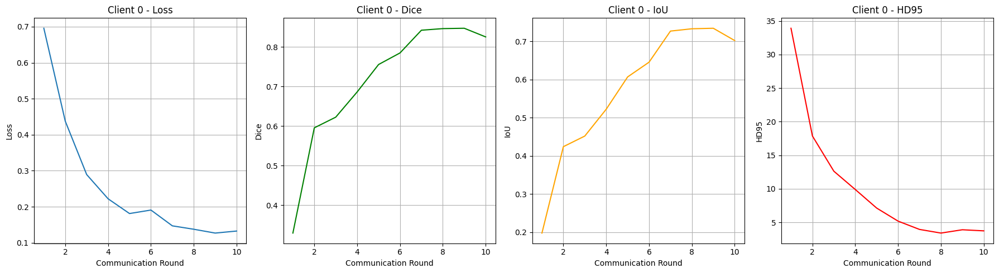

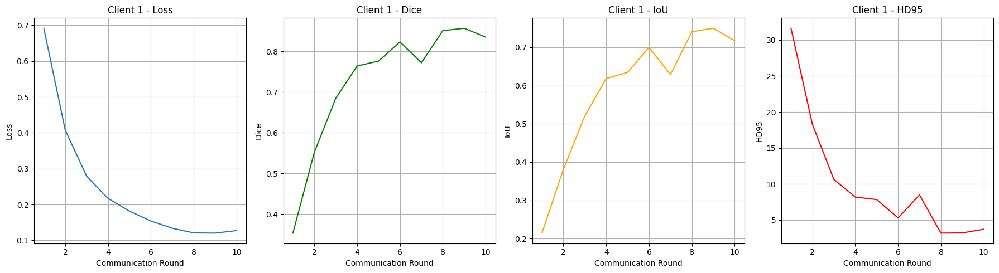

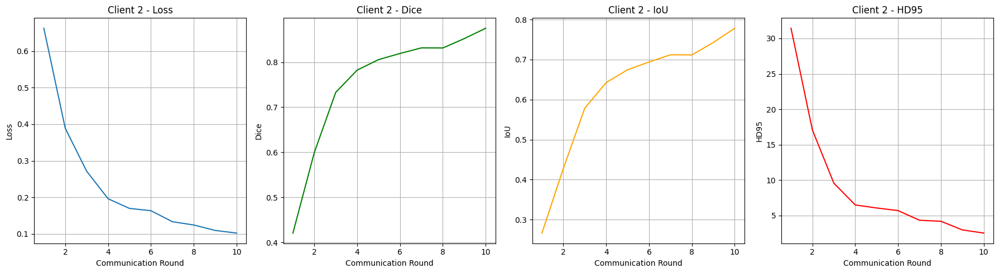

In [73]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

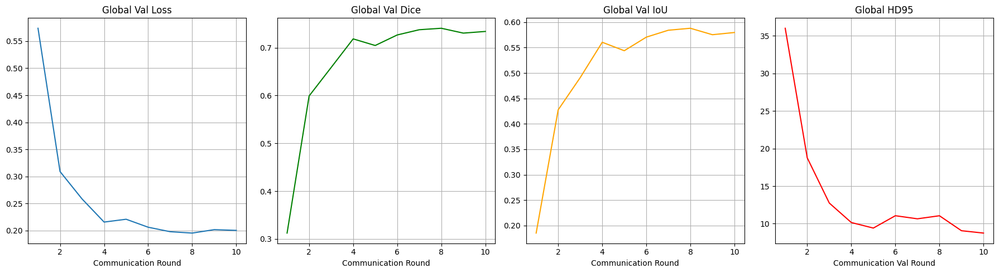

In [74]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [75]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_17344\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8,

Testing:  52%|█████▏    | 26/50 [00:06<00:06,  3.81it/s, Dice=0.6373, IoU=0.4676, HD95=10.1194]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing:  54%|█████▍    | 27/50 [00:07<00:05,  3.84it/s, Dice=0.6137, IoU=0.4426, HD95=10.1194]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s, Dice=0.6853, IoU=0.5212, HD95=8.6609] 


Test Set Metrics:
Dice: 0.6853
IoU: 0.5212
HD95: 8.6609


**Visualize**

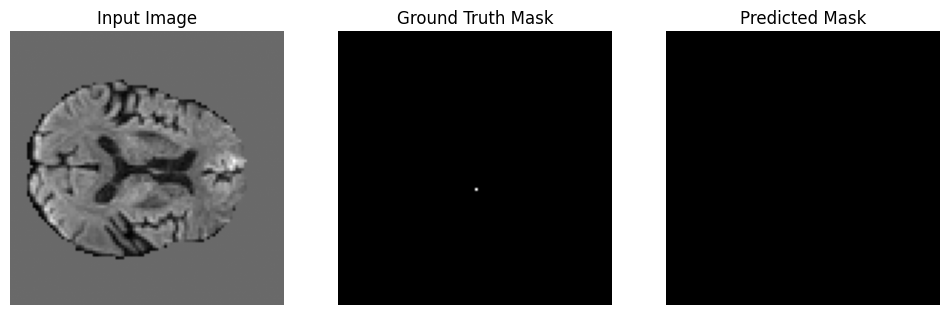

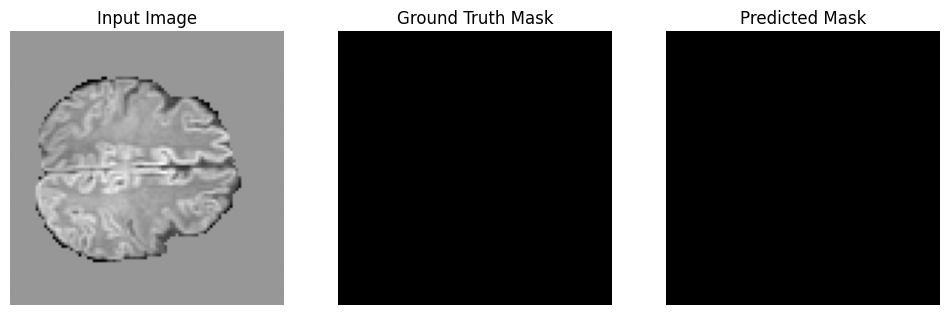

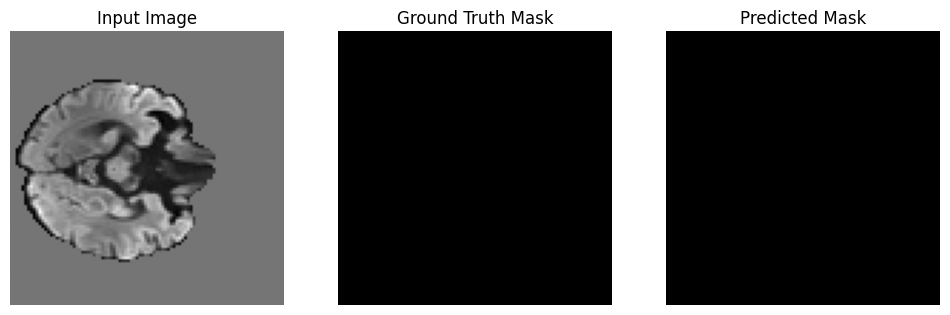

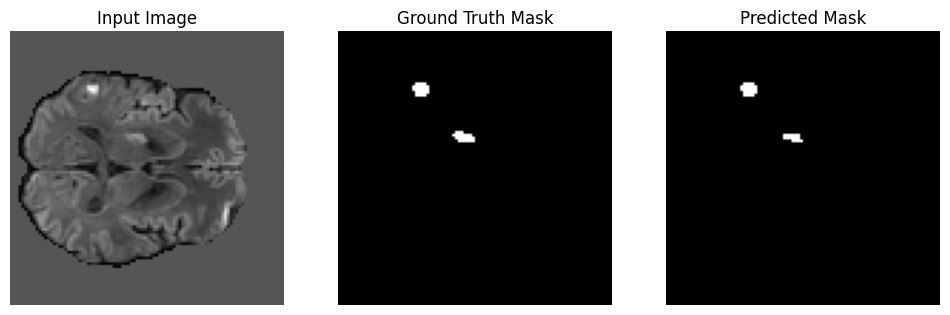

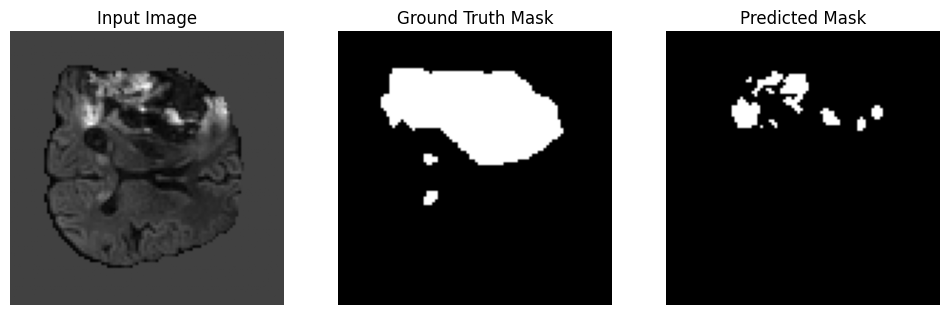

...

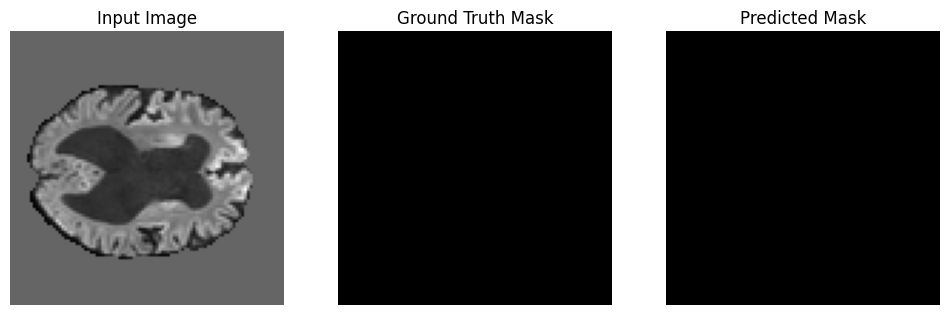

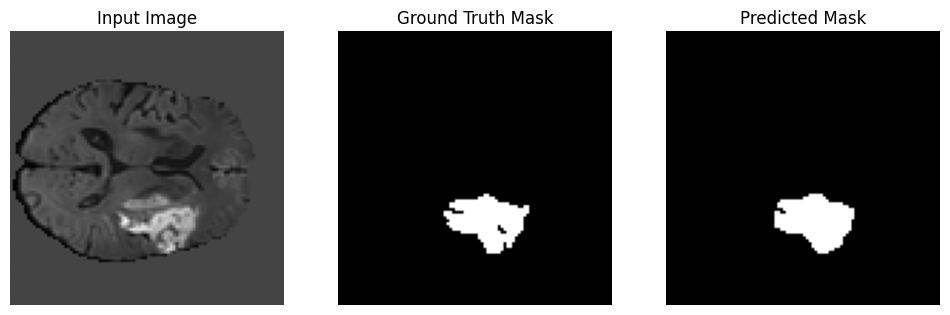

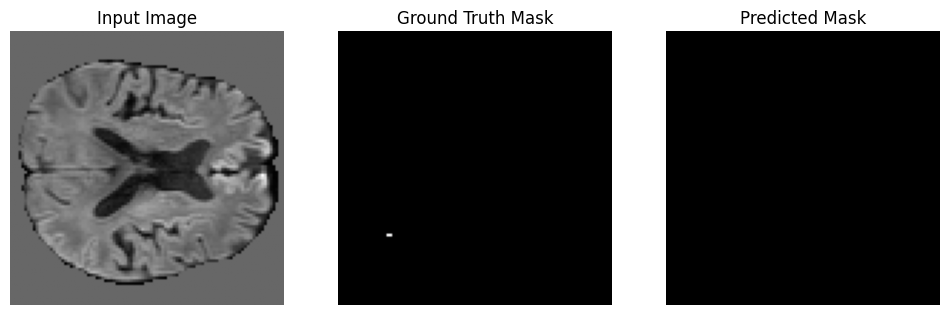

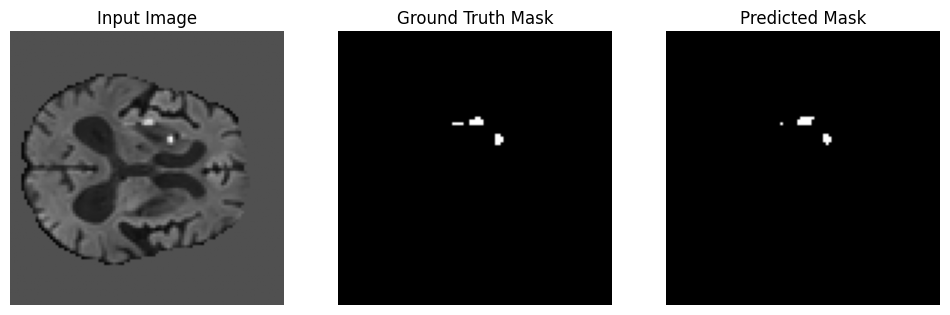

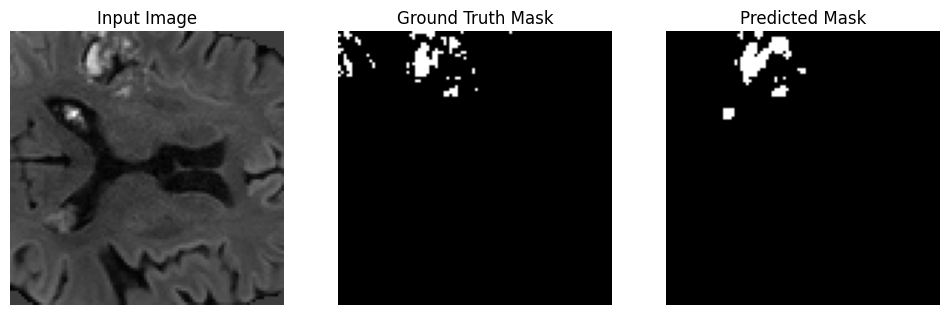

In [76]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()